# Imports

In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
import os
os.chdir("/content/drive/MyDrive/mlproject")
!ls

 all_authors.tsv
 all_publications.tsv
 BLG527E_Project.ipynb
 dbscan_15_2_all_mini_l6v2.pickle
 dbscan_15_2_all_minilm_l3v2.pickle
 dbscan_15_2_all_mpnet_basev2.pickle
 dbscan_17_2_all_mini_l6v2.pickle
 dbscan_17_2_all_minilm_l3v2.pickle
 dbscan_17_2_all_mpnet_basev2.pickle
 dbscan_20_2_all_mini_l6v2.pickle
 dbscan_20_2_all_minilm_l3v2.pickle
 dbscan_20_2_all_mpnet_basev2.pickle
 dbscan_25_2_all_mini_l6v2.pickle
 dbscan_25_2_all_minilm_l3v2.pickle
 dbscan_25_2_all_mpnet_basev2.pickle
 dbscan_55_2.pickle
 dbscan_65_5.pickle
'DBSCAN all features'
 DBSCAN.ipynb
 dbscan_manhattan_150_2_all_minilm_l3v2.pickle
 dbscan_manhattan_160_2_all_mini_l6v2.pickle
 dbscan_manhattan_160_2_all_mpnet_basev2.pickle
 dbscan_manhattan_180_2_all_mini_l6v2.pickle
 dbscan_manhattan_180_2_all_minilm_l3v2.pickle
 dbscan_manhattan_180_2_all_mpnet_basev2.pickle
 dbscan_manhattan_200_2_all_mini_l6v2.pickle
 dbscan_manhattan_200_2_all_minilm_l3v2.pickle
 dbscan_manhattan_200_2_all_mpnet_basev2.pickle
 dbscan_manhat

In [ ]:
!pip install sentence_transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 85 kB 2.9 MB/s 
     |████████████████████████████████| 5.8 MB 31.0 MB/s 
     |████████████████████████████████| 1.3 MB 40.8 MB/s 
     |████████████████████████████████| 182 kB 54.5 MB/s 
     |████████████████████████████████| 7.6 MB 28.5 MB/s 
  Created wheel for sentence-transformers: filename=sentence_transformers-2.2.2-py3-none-any.whl size=125938 sha256=09181ed581bcad62ff7820d78d75bf08deefe8c6c366a5fc2e8233fefcf361c4
  Stored in directory: /root/.cache/pip/wheels/5e/6f/8c/d88aec621f3f542d26fac0342bef5e693335d125f4e54aeffe
Successfully built sentence-transformers


In [4]:
!pip3 install -U scikit-learn scipy matplotlib

ERROR: Could not install packages due to an OSError: [WinError 5] Erişim engellendi: 'C:\\Users\\B3LAB\\anaconda3\\Lib\\site-packages\\~atplotlib\\ft2font.cp39-win_amd64.pyd'
Consider using the `--user` option or check the permissions.




     ---------------------------------------- 8.3/8.3 MB 3.6 MB/s eta 0:00:00
     ---------------------------------------- 40.2/40.2 MB 3.3 MB/s eta 0:00:00
     ---------------------------------------- 7.2/7.2 MB 3.7 MB/s eta 0:00:00
     -------------------------------------- 298.0/298.0 kB 3.7 MB/s eta 0:00:00
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.6.1
    Uninstalling matplotlib-3.6.1:
      Successfully uninstalled matplotlib-3.6.1


In [1]:
#NLP 
#import spacy
#from spacy.lang.en.stop_words import STOP_WORDS
#from spacy.lang.en import English

import string

from multiprocessing import  Pool
import numpy as np
import pandas as pd

#from sentence_transformers import SentenceTransformer
#from sentence_transformers import util
#import tensorflow as tf
#from sklearn.preprocessing import StandardScaler

#from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
#from sklearn.neighbors import NearestNeighbors
#from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.mixture import GaussianMixture
import pickle


In [ ]:
#read data from .tsv files
import pandas as pd
df_all_authors = pd.read_csv("all_authors.tsv", sep='\t', encoding= 'ISO-8859-1')
df_all_publications = pd.read_csv("all_publications.tsv", sep='\t')
df_selected_author_publications = pd.read_csv("selected_author_publications_information.tsv", sep='\t')
df_selected_publication_citations = pd.read_csv("selected_publication_citations_information.tsv", sep='\t')

In [ ]:
# Drop duplicates
df_all_publications.drop_duplicates(inplace=True)
df_selected_publication_citations.drop_duplicates(inplace=True)

# Drop NA's
#
print(df_all_publications.isna().sum())
print(df_selected_publication_citations.isna().sum())
df_selected_publication_citations.drop(['citation_sentence_cited'], axis=1, inplace=True)
df_all_publications.dropna(inplace=True)
print(df_all_publications.isna().sum())

paper_id                         0
paper_dblp_key                   0
paper_title                      0
paper_filtered_title             0
paper_published_date             0
paper_published_conference       0
paper_gscholar_url               0
paper_dblp_url                   0
paper_abstract                2529
dtype: int64
citing_paper_id                   0
cited_paper_id                    0
citation_title                    0
citation_filtered_title           0
citation_sentence_before       3843
citation_sentence_cited          25
citation_sentence_after        3391
citation_position (section)       0
dtype: int64
paper_id                      0
paper_dblp_key                0
paper_title                   0
paper_filtered_title          0
paper_published_date          0
paper_published_conference    0
paper_gscholar_url            0
paper_dblp_url                0
paper_abstract                0
dtype: int64


In [ ]:
titles    = []
abstracts = []
confs      = []
citeds    = []
cited_confs = []
cited_abs = []

for cited_idx, title in enumerate(df_selected_publication_citations['citation_filtered_title']):
    paper_id_found = False
    cited_paper_id = df_selected_publication_citations['cited_paper_id'].iloc[cited_idx]   
    paper_id = df_selected_publication_citations["citing_paper_id"].iloc[cited_idx]

    # All publications has not contain paper information for paper_id = 5835
    try:
        citeds.append(title)
        titles.append(df_all_publications['paper_title'].iloc[df_all_publications.index[df_all_publications['paper_id'] == paper_id].tolist()[0]])
        abstracts.append(df_all_publications['paper_abstract'].iloc[df_all_publications.index[df_all_publications['paper_id'] == paper_id].tolist()[0]])
        confs.append(df_all_publications['paper_published_conference'].iloc[df_all_publications.index[df_all_publications['paper_id'] == paper_id].tolist()[0]])
        paper_id_found = True
        cited_confs.append(df_all_publications['paper_published_conference'].iloc[df_all_publications.index[df_all_publications['paper_id'] == cited_paper_id].tolist()[0]])
        cited_abs.append(df_all_publications['paper_abstract'].iloc[df_all_publications.index[df_all_publications['paper_id'] == cited_paper_id].tolist()[0]])
    except:
        if paper_id_found:
            titles.pop()
            abstracts.pop()
            confs.pop()
            citeds.pop()
        continue

In [ ]:
headers = ['paper_title', 'paper_abstract', 'paper_published_conference', 'cited_paper_title', 'cited_paper_published_conference', 'cited_paper_abstract']
df = pd.DataFrame(list(zip(titles, abstracts, confs, citeds, cited_confs, cited_abs)),
               columns = headers)

df['paper_abstract'] = df['paper_abstract'].astype(str).map(lambda x: x.lstrip('[').rstrip(']'))
df['cited_paper_abstract'] = df['cited_paper_abstract'].astype(str).map(lambda x: x.lstrip('[').rstrip(']'))

train_set = df.sample(frac = 0.7)
test_set  = df.drop(train_set.index)

# Check the ratio
print(df.shape)
print(train_set.shape[0] / df.shape[0])
print(test_set.shape[0] / df.shape[0])

df.head(5)
train_set.head(5)

In [ ]:
train_set.to_csv("train_set.tsv", sep='\t')
test_set.to_csv("test_set.tsv", sep='\t')

In [ ]:
punctuations = string.punctuation
stopwords = list(STOP_WORDS)
stopwords[:10]

custom_stop_words = [
    'doi', 'preprint', 'copyright', 'peer', 'reviewed', 'org', 'https', 'et', 'al', 'author', 'figure', 
    'rights', 'reserved', 'permission', 'used', 'using', 'biorxiv', 'medrxiv', 'license', 'fig', 'fig.', 
    'al.', 'Elsevier', 'PMC', 'CZI', 'www'
]

for w in custom_stop_words:
    if w not in stopwords:
        stopwords.append(w)

print(len(stopwords))

350


In [ ]:
parser = spacy.load("en_core_web_sm")
parser.max_length = 7000000

def call_tokenizer(df):
    df["processed_paper_abstract"] = df["paper_abstract"].apply(spacy_tokenizer)
    #df["processed_cited_paper_abstract"] = df["cited_paper_abstract"].apply(spacy_tokenizer)
    return df

def spacy_tokenizer(sentence):
    mytokens = parser(sentence)
    mytokens = [ word.lemma_.lower().strip() if word.lemma_ != "-PRON-" else word.lower_ for word in mytokens ]
    mytokens = [ word for word in mytokens if word not in stopwords and word not in punctuations ]
    mytokens = " ".join([i for i in mytokens])
    return mytokens

In [ ]:
def parallelize_dataframe(df, func, n_cores=4):
    df_split = np.array_split(df, n_cores)
    pool = Pool(n_cores)
    df = pd.concat(pool.map(func, df_split))
    pool.close()
    pool.join()
    return df

In [ ]:
loaded_train_set = pd.read_csv("train_set.tsv", sep='\t')
loaded_test_set = pd.read_csv("test_set.tsv", sep='\t')

In [ ]:
loaded_train_set.drop(columns = 'Unnamed: 0', axis = 1, inplace= True)
print(loaded_train_set.shape)
loaded_train_set.head(5)
loaded_train_set.drop(columns = 'cited_paper_title', axis = 1, inplace= True)
loaded_train_set.drop(columns = 'cited_paper_published_conference', axis = 1, inplace= True)
loaded_train_set.drop(columns = 'cited_paper_abstract', axis = 1, inplace= True)
loaded_train_set.drop(columns = 'paper_published_conference', axis = 1, inplace= True)
loaded_train_set.drop(columns = 'paper_title', axis = 1, inplace= True)
loaded_train_set.to_csv('train_set_1_feat.tsv', sep="\t")

(7220, 6)


In [ ]:
loaded_train_set.head()

,paper_abstract
0,Difference rewards and potential-based reward ...
1,Network virtualization can eradicate the ossif...
2,Algorithmic mechanism design considers distrib...
3,Chemical composition of interfaces-free surfac...
4,Efficient evaluation of spatial queries is an ...


In [ ]:
%time loaded_train_set = parallelize_dataframe(df=loaded_train_set, func=call_tokenizer, n_cores=50)

CPU times: user 1.73 s, sys: 3.02 s, total: 4.74 s
Wall time: 4min 14s


In [ ]:
loaded_test_set.drop(columns = 'Unnamed: 0', axis = 1, inplace= True)
print(loaded_test_set.shape)
loaded_test_set.head(5)
loaded_test_set.drop(columns = 'cited_paper_title', axis = 1, inplace= True)
loaded_test_set.drop(columns = 'cited_paper_published_conference', axis = 1, inplace= True)
loaded_test_set.drop(columns = 'cited_paper_abstract', axis = 1, inplace= True)
loaded_test_set.drop(columns = 'paper_published_conference', axis = 1, inplace= True)
loaded_test_set.drop(columns = 'paper_title', axis = 1, inplace= True)
loaded_test_set.to_csv('test_set_1_feat.tsv', sep="\t")
print(loaded_test_set.shape)
loaded_test_set.head(5)

(3095, 6)
(3095, 1)


,paper_abstract
0,In this article we propose a framework that ge...
1,Conversational Recommender Systems (CoRSs) imp...
2,Conversational Recommender Systems (CoRSs) imp...
3,"In this pa, per we present HealthNet (HN), a s..."
4,"In the Internet of Things, smart devices are c..."


# TEXT TO VEC

In [ ]:
model_1 = SentenceTransformer('all-MiniLM-L6-v2')
model_2 = SentenceTransformer('all-mpnet-base-v2')
model_3 = SentenceTransformer('paraphrase-MiniLM-L3-v2')



#For other pre-trained models, please check link below:
#https://www.sbert.net/docs/pretrained_models.html

# For other columns
#title_embedding = model.encode(loaded_train_set["paper_title"])
#conf_embedding = model.encode(loaded_train_set["paper_published_conference"])
#cited_title_embedding = model.encode(loaded_train_set["cited_paper_title"])
#cited_conf_embedding = model.encode(loaded_train_set["cited_paper_published_conference"])
#cited_abs_embedding = model.encode(loaded_train_set["cited_paper_abstract"])

# For paper abstracts

# Model : all-MiniLM-L6-v2
abs_embedding_train_all_mini_l6v2 = model_1.encode(loaded_train_set["paper_abstract"])
print(abs_embedding_train_all_mini_l6v2.shape)

# Model : all-mpnet-base-v2
abs_embedding_train_all_mpnet_basev2 = model_2.encode(loaded_train_set["paper_abstract"])
print(abs_embedding_train_all_mpnet_basev2.shape)

#Model : paraphrase-MiniLM-L3-v2
abs_embedding_train_all_minilm_l3v2 = model_3.encode(loaded_train_set["paper_abstract"])
print(abs_embedding_train_all_minilm_l3v2.shape)

(7220, 384)
(7220, 768)
(7220, 384)


In [ ]:
model_1 = SentenceTransformer('all-MiniLM-L6-v2')
model_2 = SentenceTransformer('all-mpnet-base-v2')
model_3 = SentenceTransformer('paraphrase-MiniLM-L3-v2')
# For other columns
#title_embedding = model.encode(loaded_test_set["paper_title"])
#conf_embedding = model.encode(loaded_test_set["paper_published_conference"])
#cited_title_embedding = model.encode(loaded_test_set["cited_paper_title"])
#cited_conf_embedding = model.encode(loaded_test_set["cited_paper_published_conference"])
#cited_abs_embedding = model.encode(loaded_test_set["cited_paper_abstract"])

# For paper abstracts

# Model : all-MiniLM-L6-v2
abs_embedding_test_all_mini_l6v2 = model_1.encode(loaded_test_set["paper_abstract"])
print(abs_embedding_test_all_mini_l6v2.shape)

# Model : all-mpnet-base-v2
abs_embedding_test_all_mpnet_basev2 = model_2.encode(loaded_test_set["paper_abstract"])
print(abs_embedding_test_all_mpnet_basev2.shape)

#Model : paraphrase-MiniLM-L3-v2
abs_embedding_test_all_minilm_l3v2 = model_3.encode(loaded_test_set["paper_abstract"])
print(abs_embedding_test_all_minilm_l3v2.shape)

Downloading:   0%|          | 0.00/1.18k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/612 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/116 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/350 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/349 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.18k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/571 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/116 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/438M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/239 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/363 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/349 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/690 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/4.01k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/629 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/69.6M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/314 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/229 [00:00<?, ?B/s]

(3095, 384)
(3095, 768)
(3095, 384)


In [ ]:
#define scaler
scaler = StandardScaler()

scaled_train_set_all_mini_l6v2=pd.DataFrame(scaler.fit_transform(abs_embedding_train_all_mini_l6v2))
print(scaled_train_set_all_mini_l6v2.shape)

scaled_train_set_all_mpnet_basev2=pd.DataFrame(scaler.fit_transform(abs_embedding_train_all_mpnet_basev2))
print(scaled_train_set_all_mpnet_basev2.shape)

scaled_train_set_all_minilm_l3v2=pd.DataFrame(scaler.fit_transform(abs_embedding_train_all_minilm_l3v2))
print(scaled_train_set_all_minilm_l3v2.shape)

(7220, 384)
(7220, 768)
(7220, 384)


In [ ]:
#define scaler
scaler = StandardScaler()
scaled_test_set_all_mini_l6v2=pd.DataFrame(scaler.fit_transform(abs_embedding_test_all_mini_l6v2))
print(scaled_test_set_all_mini_l6v2.shape)


scaled_test_set_all_mpnet_basev2=pd.DataFrame(scaler.fit_transform(abs_embedding_test_all_mpnet_basev2))
print(scaled_test_set_all_mpnet_basev2.shape)


scaled_test_set_all_minilm_l3v2=pd.DataFrame(scaler.fit_transform(abs_embedding_test_all_minilm_l3v2))
print(scaled_test_set_all_minilm_l3v2.shape)


(3095, 384)
(3095, 768)
(3095, 384)


# Model : all-MiniLM-L6-v2

In [ ]:
pca_all_mini_l6v2 = PCA()
pca_result_all_mini_l6v2 = pca_all_mini_l6v2.fit_transform((scaled_train_set_all_mini_l6v2))
print('Cumulative variance explained by principal components: {:.2%}'.format(np.sum(pca_all_mini_l6v2.explained_variance_ratio_)))
n_pcs= pca_all_mini_l6v2.components_.shape[0]
print("Number of principal components : {}". format(n_pcs))
print("Shape of principal components : {}". format(pca_all_mini_l6v2.components_.shape))

Cumulative variance explained by principal components: 100.00%
Number of principal components : 384
Shape of principal components : (384, 384)


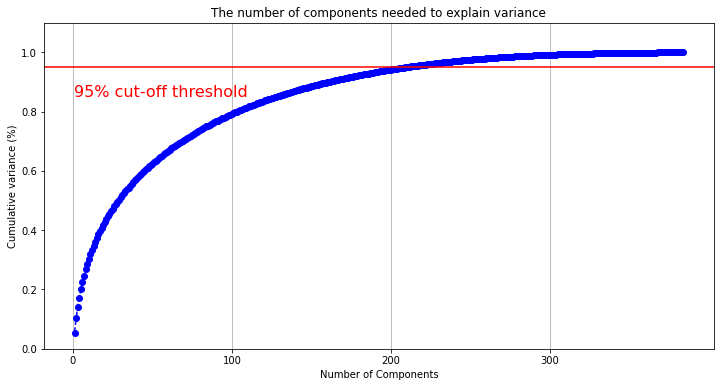

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1, n_pcs+1, step=1)
y = np.cumsum(pca_all_mini_l6v2.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, n_pcs, step=100)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(0.5, 0.85, '95% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

In [ ]:
pca_all_mini_l6v2 = PCA(n_components=0.95)
principalComponents_all_mini_l6v2 = pca_all_mini_l6v2.fit_transform(scaled_train_set_all_mini_l6v2)
principalComponents_all_mini_l6v2.shape

(7220, 211)

In [3]:
#pd.DataFrame(principalComponents_all_mini_l6v2).to_csv("train_set_final_all-MiniLM-L6-v2.tsv", sep='\t')
principalComponents_all_mini_l6v2 = pd.read_csv("train_set_final_all-MiniLM-L6-v2.tsv", sep='\t')
principalComponents_all_mini_l6v2.drop(columns = 'Unnamed: 0', axis = 1, inplace= True)
principalComponents_all_mini_l6v2.shape

(7220, 211)

In [4]:
#principalComponents_all_mini_l6v2_test = pca_all_mini_l6v2.transform(scaled_test_set_all_mini_l6v2)
#pd.DataFrame(principalComponents_all_mini_l6v2_test).to_csv("test_set_final_all-MiniLM-L6-v2.tsv", sep='\t')
principalComponents_all_mini_l6v2_test = pd.read_csv("test_set_final_all-MiniLM-L6-v2.tsv", sep='\t')
principalComponents_all_mini_l6v2_test.drop(columns = 'Unnamed: 0', axis = 1, inplace= True)
principalComponents_all_mini_l6v2_test.shape

(3095, 211)

# Model : all-mpnet-base-v2

In [ ]:
pca_all_mpnet_basev2 = PCA()
pca_result_all_mpnet_basev2 = pca_all_mpnet_basev2.fit_transform((scaled_train_set_all_mpnet_basev2))
print('Cumulative variance explained by principal components: {:.2%}'.format(np.sum(pca_all_mpnet_basev2.explained_variance_ratio_)))
n_pcs= pca_all_mpnet_basev2.components_.shape[0]
print("Number of principal components : {}". format(n_pcs))
print("Shape of principal components : {}". format(pca_all_mpnet_basev2.components_.shape))

Cumulative variance explained by principal components: 100.00%
Number of principal components : 768
Shape of principal components : (768, 768)


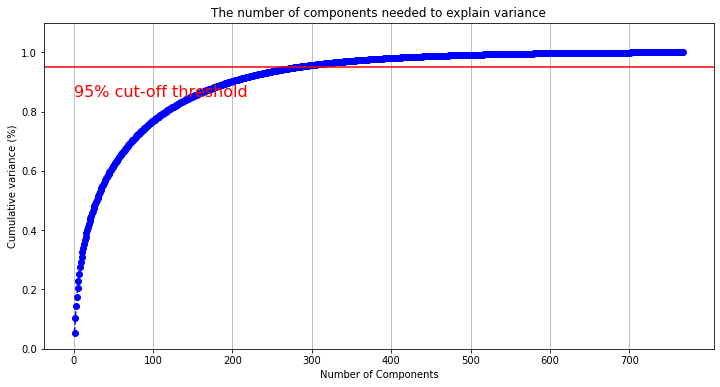

In [ ]:
plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1, n_pcs+1, step=1)
y = np.cumsum(pca_all_mpnet_basev2.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, n_pcs, step=100)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(0.5, 0.85, '95% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

In [ ]:
pca_all_mpnet_basev2 = PCA(n_components=0.95)
principalComponents_all_mpnet_basev2 = pca_all_mpnet_basev2.fit_transform(scaled_train_set_all_mpnet_basev2)
principalComponents_all_mpnet_basev2.shape

(7220, 282)

In [2]:
#pd.DataFrame(principalComponents_all_mpnet_basev2).to_csv("train_set_final_all_mpnet_basev2.tsv", sep='\t')
principalComponents_all_mpnet_basev2 = pd.read_csv("train_set_final_all_mpnet_basev2.tsv", sep='\t')
principalComponents_all_mpnet_basev2.drop(columns = 'Unnamed: 0', axis = 1, inplace= True)
principalComponents_all_mpnet_basev2.shape

(7220, 282)

In [3]:
#principalComponents_all_mpnet_basev2_test = pca_all_mpnet_basev2.transform(scaled_test_set_all_mpnet_basev2)
#pd.DataFrame(principalComponents_all_mpnet_basev2_test).to_csv("test_set_final_all_mpnet_basev2.tsv", sep='\t')
principalComponents_all_mpnet_basev2_test = pd.read_csv("test_set_final_all_mpnet_basev2.tsv", sep='\t')
principalComponents_all_mpnet_basev2_test.drop(columns = 'Unnamed: 0', axis = 1, inplace= True)
principalComponents_all_mpnet_basev2_test.shape

(3095, 282)

# Model : paraphrase-MiniLM-L3-v2

In [ ]:
pca_all_minilm_l3v2 = PCA()
pca_result_all_minilm_l3v2 = pca_all_minilm_l3v2.fit_transform((scaled_train_set_all_minilm_l3v2))
print('Cumulative variance explained by principal components: {:.2%}'.format(np.sum(pca_all_minilm_l3v2.explained_variance_ratio_)))
n_pcs= pca_all_minilm_l3v2.components_.shape[0]
print("Number of principal components : {}". format(n_pcs))
print("Shape of principal components : {}". format(pca_all_minilm_l3v2.components_.shape))

Cumulative variance explained by principal components: 100.00%
Number of principal components : 384
Shape of principal components : (384, 384)


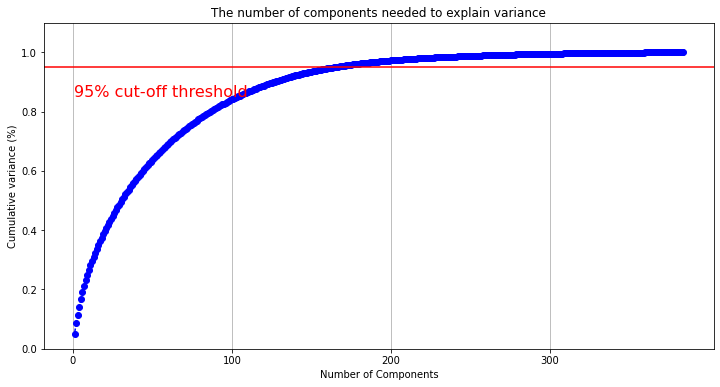

In [ ]:
plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1, n_pcs+1, step=1)
y = np.cumsum(pca_all_minilm_l3v2.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, n_pcs, step=100)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(0.5, 0.85, '95% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

In [ ]:
pca_all_minilm_l3v2 = PCA(n_components=0.95)
principalComponents_all_minilm_l3v2 = pca_all_minilm_l3v2.fit_transform(scaled_train_set_all_minilm_l3v2)
principalComponents_all_minilm_l3v2.shape

(7220, 165)

In [4]:
#pd.DataFrame(principalComponents_all_minilm_l3v2).to_csv("train_set_final_all_minilm_l3v2.tsv", sep='\t')
principalComponents_all_minilm_l3v2 = pd.read_csv("train_set_final_all_minilm_l3v2.tsv", sep='\t')
principalComponents_all_minilm_l3v2.drop(columns = 'Unnamed: 0', axis = 1, inplace= True)
principalComponents_all_minilm_l3v2.shape

(7220, 165)

In [5]:
#principalComponents_all_minilm_l3v2_test = pca_all_minilm_l3v2.transform(scaled_test_set_all_minilm_l3v2)
#pd.DataFrame(principalComponents_all_minilm_l3v2_test).to_csv("test_set_final_all_minilm_l3v2.tsv", sep='\t')
principalComponents_all_minilm_l3v2_test = pd.read_csv("test_set_final_all_minilm_l3v2.tsv", sep='\t')
principalComponents_all_minilm_l3v2_test.drop(columns = 'Unnamed: 0', axis = 1, inplace= True)
principalComponents_all_minilm_l3v2_test.shape

(3095, 165)

# Clustering

## DBSCAN

In [ ]:
def dbscan_predict(model, X):
    nr_samples = X.shape[0]
    y_new = np.ones(shape=nr_samples, dtype=int) * -1
    for i in range(nr_samples):
        diff = model.components_ - list(X.iloc[i, :])  # NumPy broadcasting
        dist = np.linalg.norm(diff, axis=1)  # Euclidean distance

        shortest_dist_idx = np.argmin(dist)

        if dist[shortest_dist_idx] < model.eps:
            y_new[i] = model.labels_[model.core_sample_indices_[shortest_dist_idx]]

    return y_new

In [ ]:
def dbscan_predict_manhattan(model, X):
  nr_samples = X.shape[0]
  y_new = np.ones(shape=nr_samples, dtype=int) * -1
  for i in range(nr_samples):
    
    diff = abs(model.components_ - list(X.iloc[i, :]))  # NumPy broadcasting
    dist = np.ones(shape=diff.shape[0], dtype=float) 
    for j in range(diff.shape[0]):
      dist[j] = sum(diff[i,:]) 
    shortest_dist_idx = np.argmin(dist)
    
    if dist[shortest_dist_idx] < model.eps:
      y_new[i] = model.labels_[model.core_sample_indices_[shortest_dist_idx]]
  return y_new

### Model : all-MiniLM-L6-v2

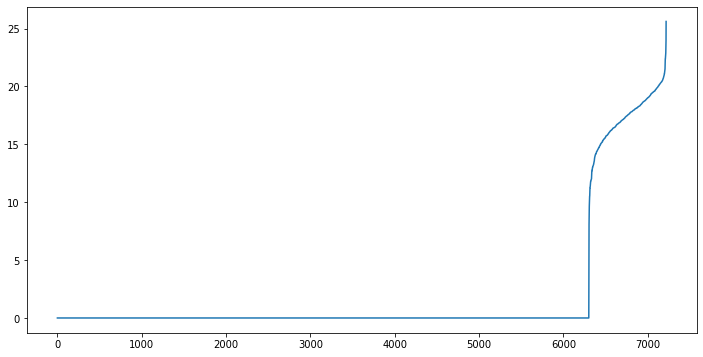

In [ ]:
#https://stats.stackexchange.com/questions/406587/determining-epsilon-for-dbscan
#https://towardsdatascience.com/machine-learning-clustering-dbscan-determine-the-optimal-value-for-epsilon-eps-python-example-3100091cfbc

neigh = NearestNeighbors(n_neighbors=2, metric='euclidean')
nbrs = neigh.fit(principalComponents_all_mini_l6v2)
distances, indices = nbrs.kneighbors(principalComponents_all_mini_l6v2)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [ ]:
DBSCAN_cluster_all_mini_l6v2 = DBSCAN(eps=17, min_samples=2).fit(principalComponents_all_mini_l6v2) 
labels = dbscan_predict(DBSCAN_cluster_all_mini_l6v2, principalComponents_all_mini_l6v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2,DBSCAN_cluster_all_mini_l6v2.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2, DBSCAN_cluster_all_mini_l6v2.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  19.238162067737697
silhouette score of model on train data:  0.5774864070484053


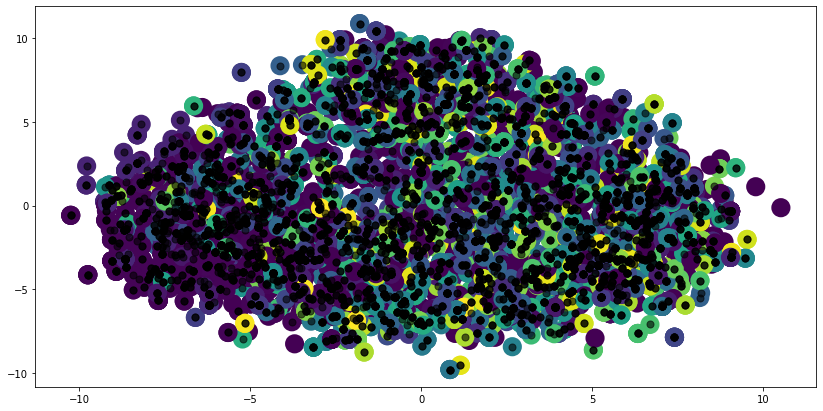

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2.iloc[:, 0], principalComponents_all_mini_l6v2.iloc[:, 1], c=DBSCAN_cluster_all_mini_l6v2.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mini_l6v2.labels_)))

Number of cluster:  980


In [ ]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2_test,labels ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2_test, labels, metric='euclidean'))

calinski harabasz score of model on test data:  6.964614992193164
silhouette score of model on test data:  0.40418807118082767


In [ ]:
print("Number of cluster: ",len(np.unique(labels)))

Number of cluster:  705


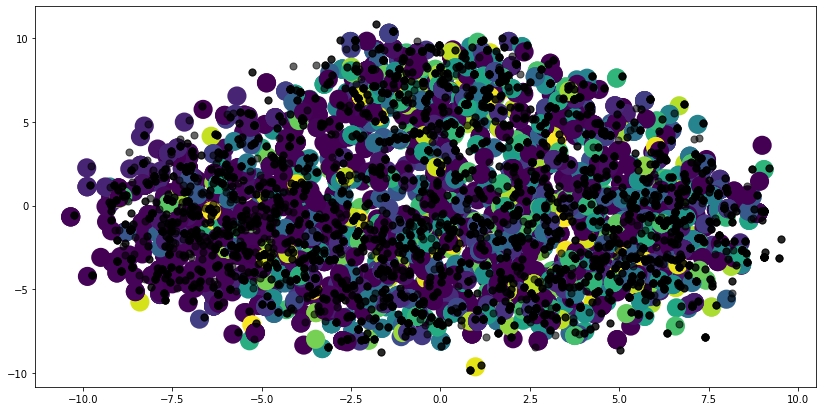

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2_test.iloc[:, 0], principalComponents_all_mini_l6v2_test.iloc[:, 1], c=labels , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
with open('dbscan_17_2_all_mini_l6v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mini_l6v2, f)

In [ ]:
DBSCAN_cluster_all_mini_l6v2_2 = DBSCAN(eps=20, min_samples=2).fit(principalComponents_all_mini_l6v2) 
labels_2 = dbscan_predict(DBSCAN_cluster_all_mini_l6v2_2, principalComponents_all_mini_l6v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2,DBSCAN_cluster_all_mini_l6v2_2.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2, DBSCAN_cluster_all_mini_l6v2_2.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  6.024325992345206
silhouette score of model on train data:  -0.038684153325595674


In [ ]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mini_l6v2_2.labels_)))

Number of cluster:  185


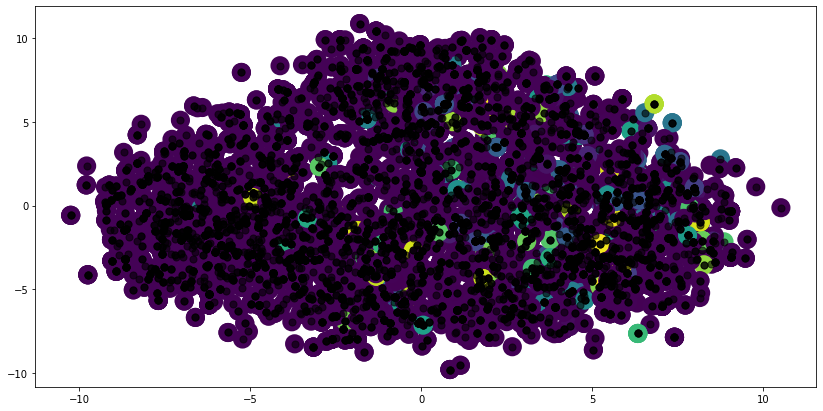

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2.iloc[:, 0], principalComponents_all_mini_l6v2.iloc[:, 1], c=DBSCAN_cluster_all_mini_l6v2_2.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2_2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2_test,labels_2 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2_test, labels_2, metric='euclidean'))

calinski harabasz score of model on test data:  3.0291460367688847
silhouette score of model on test data:  -0.06594413851915161


In [ ]:
print("Number of cluster: ",len(np.unique(labels_2)))

Number of cluster:  135


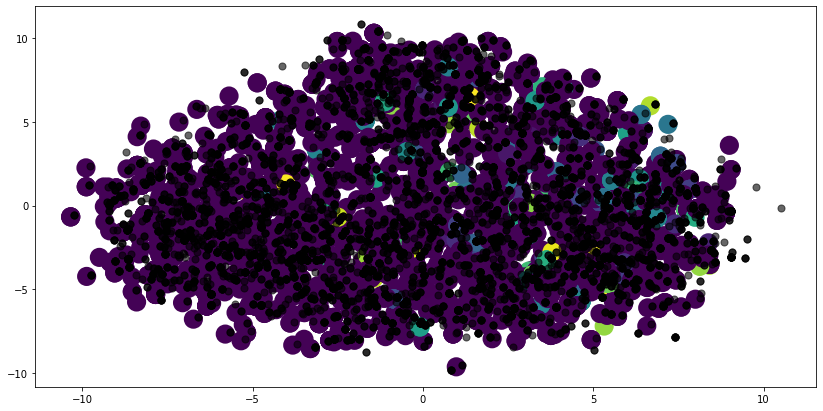

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2_test.iloc[:, 0], principalComponents_all_mini_l6v2_test.iloc[:, 1], c=labels_2 , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2_2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
with open('dbscan_20_2_all_mini_l6v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mini_l6v2_2, f)

In [ ]:
DBSCAN_cluster_all_mini_l6v2_3 = DBSCAN(eps=15, min_samples=2).fit(principalComponents_all_mini_l6v2) 
labels_3 = dbscan_predict(DBSCAN_cluster_all_mini_l6v2_3, principalComponents_all_mini_l6v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2,DBSCAN_cluster_all_mini_l6v2_3.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2, DBSCAN_cluster_all_mini_l6v2_3.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  30.37516247962971
silhouette score of model on train data:  0.7749134997851014


In [ ]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mini_l6v2_3.labels_)))

Number of cluster:  1275


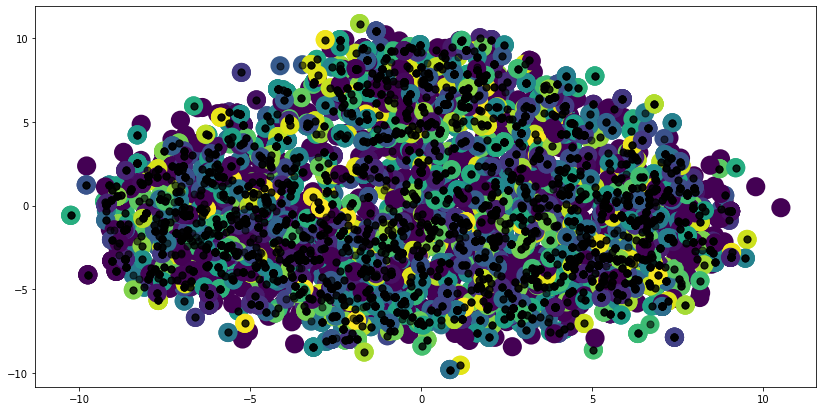

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2.iloc[:, 0], principalComponents_all_mini_l6v2.iloc[:, 1], c=DBSCAN_cluster_all_mini_l6v2_3.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2_3.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2_test,labels_3 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2_test, labels_3, metric='euclidean'))

calinski harabasz score of model on test data:  7.635781018364463
silhouette score of model on test data:  0.5213683245929098


In [ ]:
print("Number of cluster: ",len(np.unique(labels_3)))

Number of cluster:  894


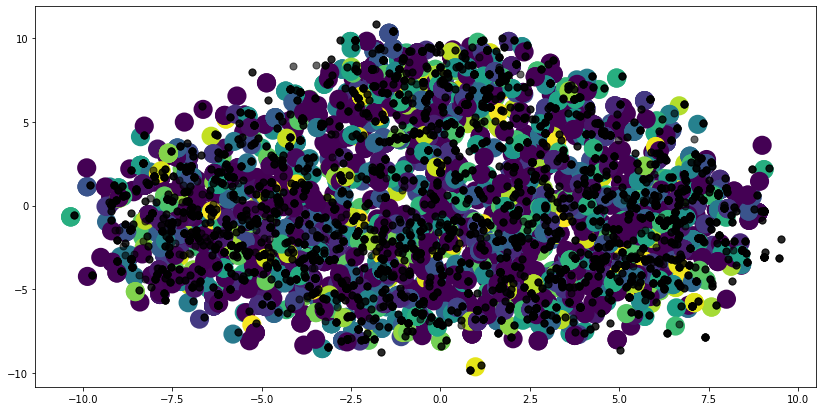

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2_test.iloc[:, 0], principalComponents_all_mini_l6v2_test.iloc[:, 1], c=labels_3 , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2_3.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
with open('dbscan_15_2_all_mini_l6v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mini_l6v2_3, f)

In [ ]:
DBSCAN_cluster_all_mini_l6v2_4 = DBSCAN(eps=25, min_samples=2).fit(principalComponents_all_mini_l6v2) 
labels_4 = dbscan_predict(DBSCAN_cluster_all_mini_l6v2_4, principalComponents_all_mini_l6v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2,DBSCAN_cluster_all_mini_l6v2_4.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2, DBSCAN_cluster_all_mini_l6v2_4.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  6.393600148847041
silhouette score of model on train data:  0.026261055840886952


In [ ]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mini_l6v2_4.labels_)))

Number of cluster:  5


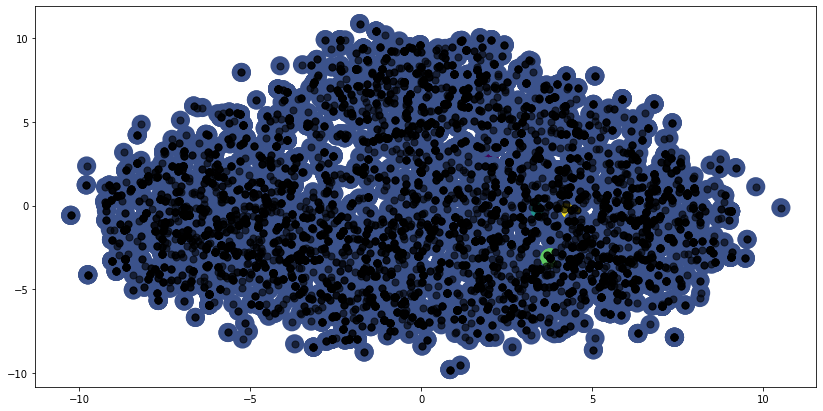

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2.iloc[:, 0], principalComponents_all_mini_l6v2.iloc[:, 1], c=DBSCAN_cluster_all_mini_l6v2_4.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2_4.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2_test,labels_4 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2_test, labels_4, metric='euclidean'))

calinski harabasz score of model on test data:  3.262508362819243
silhouette score of model on test data:  0.05942804890652919


In [ ]:
print("Number of cluster: ",len(np.unique(labels_4)))

Number of cluster:  4


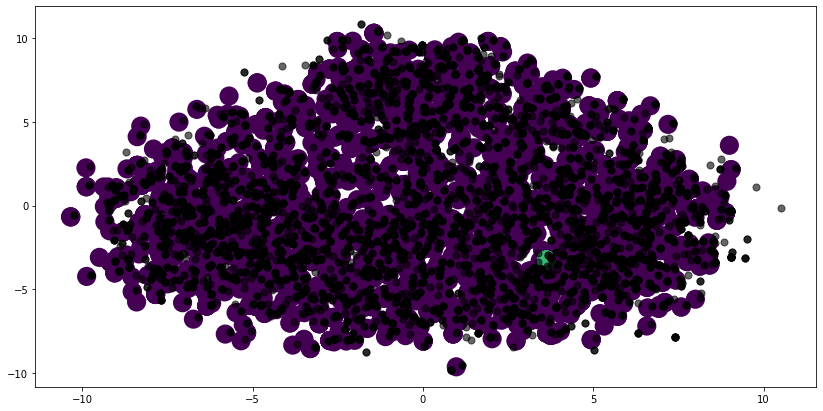

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2_test.iloc[:, 0], principalComponents_all_mini_l6v2_test.iloc[:, 1], c=labels_4 , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2_4.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
with open('dbscan_25_2_all_mini_l6v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mini_l6v2_4, f)

In [ ]:
for i in range(2,10):
  DBSCAN_cluster_all_mini_l6v2_min_samp = DBSCAN(eps=15, min_samples=i).fit(principalComponents_all_mini_l6v2) 
  print("calinski harabasz score of model with min_samples as {min}: {ch} ".format(min=i, ch= metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2,DBSCAN_cluster_all_mini_l6v2_min_samp.labels_ )) )
  print("silhouette score of model with min_samples as {min}: {ss}".format(min = i, ss= metrics.silhouette_score(principalComponents_all_mini_l6v2, DBSCAN_cluster_all_mini_l6v2_min_samp.labels_ , metric='euclidean')) )


calinski harabasz score of model with min_samples as 2: 30.37516247962971 
silhouette score of model with min_samples as 2: 0.7749134997851014
calinski harabasz score of model with min_samples as 3: 22.72870812267981 
silhouette score of model with min_samples as 3: 0.6360098900497372
calinski harabasz score of model with min_samples as 4: 20.108646051499182 
silhouette score of model with min_samples as 4: 0.49775276709170296
calinski harabasz score of model with min_samples as 5: 19.40045252094184 
silhouette score of model with min_samples as 5: 0.4043804789211314
calinski harabasz score of model with min_samples as 6: 19.224450514903047 
silhouette score of model with min_samples as 6: 0.3175452436690978
calinski harabasz score of model with min_samples as 7: 19.24361010080851 
silhouette score of model with min_samples as 7: 0.25771340641565454
calinski harabasz score of model with min_samples as 8: 19.421725794663583 
silhouette score of model with min_samples as 8: 0.19248760516

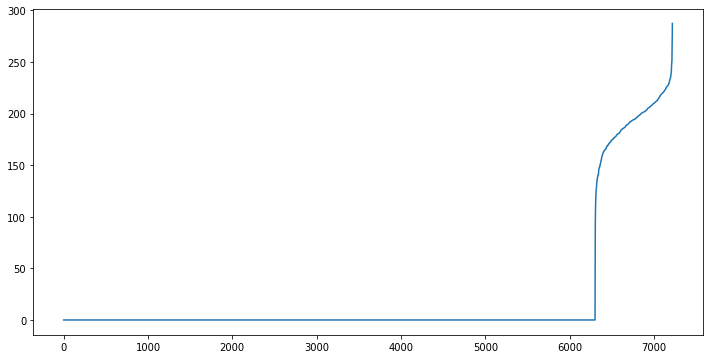

In [ ]:
#https://stats.stackexchange.com/questions/406587/determining-epsilon-for-dbscan
#https://towardsdatascience.com/machine-learning-clustering-dbscan-determine-the-optimal-value-for-epsilon-eps-python-example-3100091cfbc

neigh = NearestNeighbors(n_neighbors=2, metric='manhattan')
nbrs = neigh.fit(principalComponents_all_mini_l6v2)
distances, indices = nbrs.kneighbors(principalComponents_all_mini_l6v2)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [ ]:
DBSCAN_cluster_all_mini_l6v2_manhattan= DBSCAN(eps=180, min_samples=2, metric="manhattan").fit(principalComponents_all_mini_l6v2) 
labels_manhattan = dbscan_predict_manhattan(DBSCAN_cluster_all_mini_l6v2_manhattan, principalComponents_all_mini_l6v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2,DBSCAN_cluster_all_mini_l6v2_manhattan.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2, DBSCAN_cluster_all_mini_l6v2_manhattan.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  23.907250257760296
silhouette score of model on train data:  0.6835794156625821


In [ ]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mini_l6v2_manhattan.labels_)))

Number of cluster:  1144


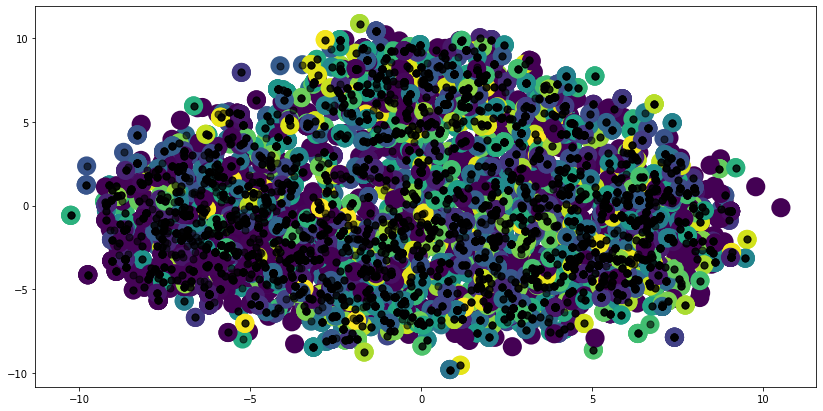

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2.iloc[:, 0], principalComponents_all_mini_l6v2.iloc[:, 1], c=DBSCAN_cluster_all_mini_l6v2_manhattan.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2_manhattan.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2_test,labels_manhattan ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2_test, labels_manhattan, metric='euclidean'))

calinski harabasz score of model on test data:  1.3536051972254681
silhouette score of model on test data:  0.01645732453422616


In [ ]:
print("Number of cluster: ",len(np.unique(labels_manhattan)))

Number of cluster:  2


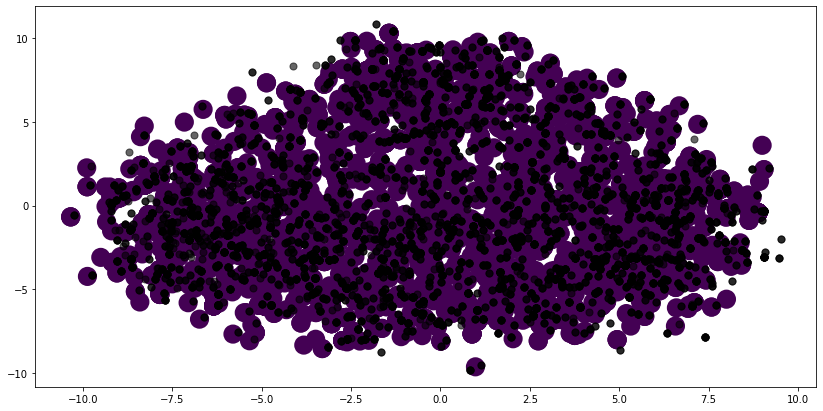

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2_test.iloc[:, 0], principalComponents_all_mini_l6v2_test.iloc[:, 1], c=labels_manhattan , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2_manhattan.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
with open('dbscan_manhattan_180_2_all_mini_l6v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mini_l6v2_manhattan, f)

In [ ]:
DBSCAN_cluster_all_mini_l6v2_manhattan_2= DBSCAN(eps=160, min_samples=2, metric="manhattan").fit(principalComponents_all_mini_l6v2) 
labels_manhattan_2 = dbscan_predict_manhattan(DBSCAN_cluster_all_mini_l6v2_manhattan_2, principalComponents_all_mini_l6v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2,DBSCAN_cluster_all_mini_l6v2_manhattan_2.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2, DBSCAN_cluster_all_mini_l6v2_manhattan_2.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  30.901443998289956
silhouette score of model on train data:  0.7979912447549204


In [ ]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mini_l6v2_manhattan_2.labels_)))

Number of cluster:  1310


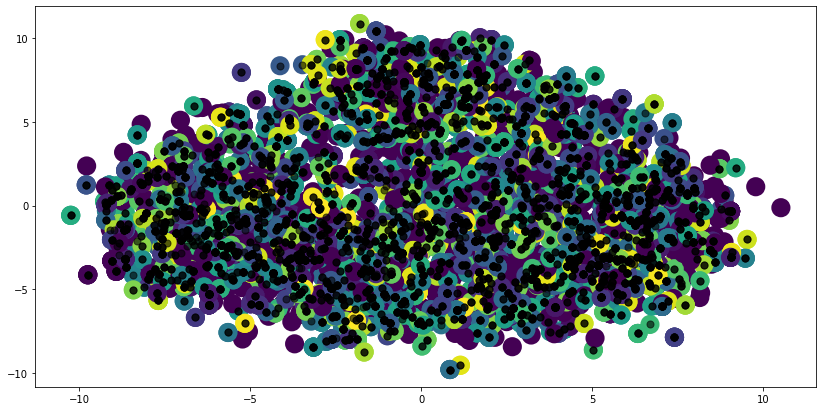

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2.iloc[:, 0], principalComponents_all_mini_l6v2.iloc[:, 1], c=DBSCAN_cluster_all_mini_l6v2_manhattan_2.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2_manhattan_2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2_test,labels_manhattan_2 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2_test, labels_manhattan_2, metric='euclidean'))

calinski harabasz score of model on test data:  0.7941655133294068
silhouette score of model on test data:  -5.420524242389414e-07


In [ ]:
print("Number of cluster: ",len(np.unique(labels_manhattan_2)))

Number of cluster:  2


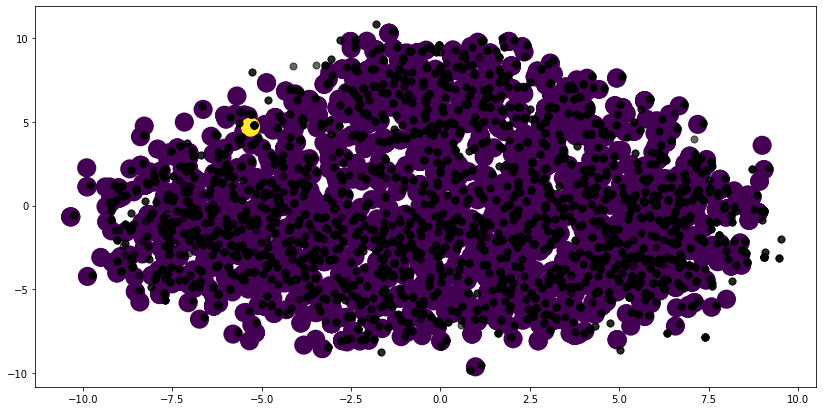

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2_test.iloc[:, 0], principalComponents_all_mini_l6v2_test.iloc[:, 1], c=labels_manhattan_2, s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2_manhattan_2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
with open('dbscan_manhattan_160_2_all_mini_l6v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mini_l6v2_manhattan_2, f)

In [ ]:
DBSCAN_cluster_all_mini_l6v2_manhattan_3= DBSCAN(eps=200, min_samples=2, metric="manhattan").fit(principalComponents_all_mini_l6v2) 
labels_manhattan_3 = dbscan_predict_manhattan(DBSCAN_cluster_all_mini_l6v2_manhattan_3, principalComponents_all_mini_l6v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2,DBSCAN_cluster_all_mini_l6v2_manhattan_3.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2, DBSCAN_cluster_all_mini_l6v2_manhattan_3.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  9.535035167451813
silhouette score of model on train data:  0.2860539766337882


In [ ]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mini_l6v2_manhattan_3.labels_)))

Number of cluster:  664


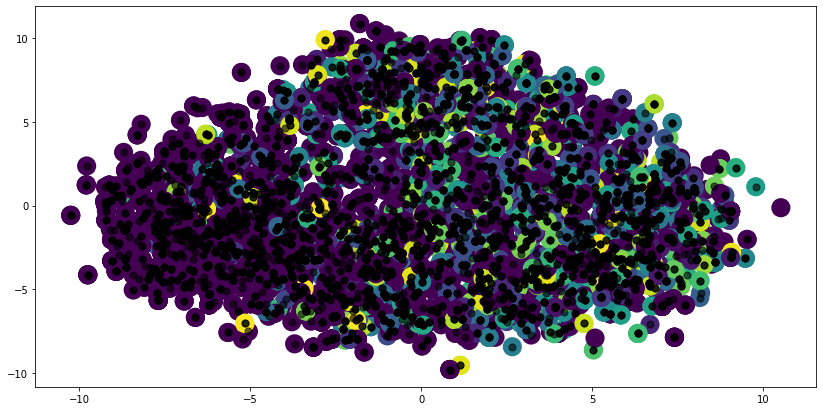

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2.iloc[:, 0], principalComponents_all_mini_l6v2.iloc[:, 1], c=DBSCAN_cluster_all_mini_l6v2_manhattan_3.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2_manhattan_3.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2_test,labels_manhattan_3 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2_test, labels_manhattan_3, metric='euclidean'))

calinski harabasz score of model on test data:  1.4214962970279192
silhouette score of model on test data:  -0.009107811843750431


In [ ]:
print("Number of cluster: ",len(np.unique(labels_manhattan_3)))

Number of cluster:  2


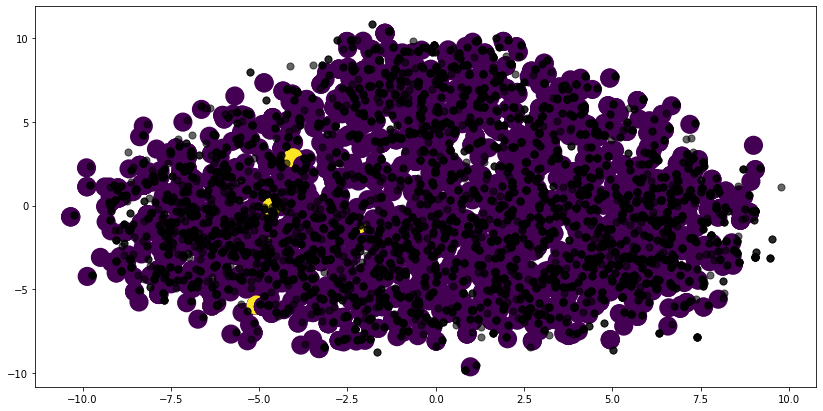

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2_test.iloc[:, 0], principalComponents_all_mini_l6v2_test.iloc[:, 1], c=labels_manhattan_3 , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2_manhattan_3.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
with open('dbscan_manhattan_200_2_all_mini_l6v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mini_l6v2_manhattan_3, f)

In [ ]:
for i in range(2,10):
  DBSCAN_cluster_all_mini_l6v2_min_samp_manhattan = DBSCAN(eps=180, min_samples=i, metric="manhattan").fit(principalComponents_all_mini_l6v2) 
  print("calinski harabasz score of model with min_samples as {min}: {ch} ".format(min=i, ch= metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2,DBSCAN_cluster_all_mini_l6v2_min_samp_manhattan.labels_ )) )
  print("silhouette score of model with min_samples as {min}: {ss}".format(min = i, ss= metrics.silhouette_score(principalComponents_all_mini_l6v2, DBSCAN_cluster_all_mini_l6v2_min_samp_manhattan.labels_ , metric='euclidean')) )


calinski harabasz score of model with min_samples as 2: 23.907250257760296 
silhouette score of model with min_samples as 2: 0.6835794156625821
calinski harabasz score of model with min_samples as 3: 21.026227690856246 
silhouette score of model with min_samples as 3: 0.5688871637351784
calinski harabasz score of model with min_samples as 4: 19.80647724670779 
silhouette score of model with min_samples as 4: 0.45260094382525995
calinski harabasz score of model with min_samples as 5: 19.552931948237067 
silhouette score of model with min_samples as 5: 0.37036616618253987
calinski harabasz score of model with min_samples as 6: 19.679734138372105 
silhouette score of model with min_samples as 6: 0.29544343031033715
calinski harabasz score of model with min_samples as 7: 19.90762890133537 
silhouette score of model with min_samples as 7: 0.2428591253401374
calinski harabasz score of model with min_samples as 8: 20.264815433959587 
silhouette score of model with min_samples as 8: 0.18339105

In [ ]:
for i in range(2,10):
  DBSCAN_cluster_all_mini_l6v2_min_samp_manhattan = DBSCAN(eps=160, min_samples=i, metric="manhattan").fit(principalComponents_all_mini_l6v2) 
  print("calinski harabasz score of model with min_samples as {min}: {ch} ".format(min=i, ch= metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2,DBSCAN_cluster_all_mini_l6v2_min_samp_manhattan.labels_ )) )
  print("silhouette score of model with min_samples as {min}: {ss}".format(min = i, ss= metrics.silhouette_score(principalComponents_all_mini_l6v2, DBSCAN_cluster_all_mini_l6v2_min_samp_manhattan.labels_ , metric='euclidean')) )


calinski harabasz score of model with min_samples as 2: 30.901443998289956 
silhouette score of model with min_samples as 2: 0.7979912447549204
calinski harabasz score of model with min_samples as 3: 22.338414343169728 
silhouette score of model with min_samples as 3: 0.6493452238122263
calinski harabasz score of model with min_samples as 4: 19.61308507441571 
silhouette score of model with min_samples as 4: 0.5048900159879939
calinski harabasz score of model with min_samples as 5: 18.93811438532315 
silhouette score of model with min_samples as 5: 0.40614478516311425
calinski harabasz score of model with min_samples as 6: 18.707588186032368 
silhouette score of model with min_samples as 6: 0.3184322540892611
calinski harabasz score of model with min_samples as 7: 18.728431147310808 
silhouette score of model with min_samples as 7: 0.25542329627657023
calinski harabasz score of model with min_samples as 8: 18.789079232941305 
silhouette score of model with min_samples as 8: 0.192302900

### Model : all-mpnet-base-v2

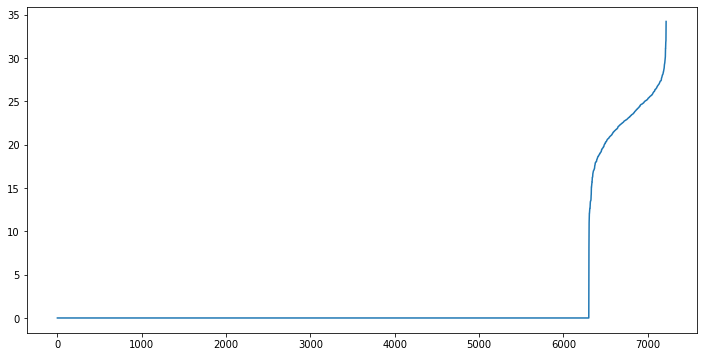

In [ ]:
#https://stats.stackexchange.com/questions/406587/determining-epsilon-for-dbscan
#https://towardsdatascience.com/machine-learning-clustering-dbscan-determine-the-optimal-value-for-epsilon-eps-python-example-3100091cfbc

neigh = NearestNeighbors(n_neighbors=2, metric='euclidean')
nbrs = neigh.fit(principalComponents_all_mpnet_basev2)
distances, indices = nbrs.kneighbors(principalComponents_all_mpnet_basev2)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [ ]:
DBSCAN_cluster_all_mpnet_basev2 = DBSCAN(eps=17, min_samples=2).fit(principalComponents_all_mpnet_basev2) 
labels = dbscan_predict(DBSCAN_cluster_all_mpnet_basev2, principalComponents_all_mpnet_basev2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2,DBSCAN_cluster_all_mpnet_basev2.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2, DBSCAN_cluster_all_mpnet_basev2.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  32.12790629070343
silhouette score of model on train data:  0.8159769479746045


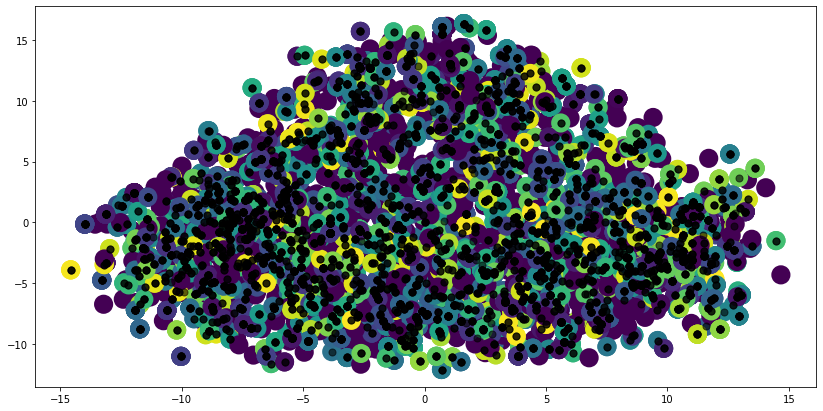

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2.iloc[:, 0], principalComponents_all_mpnet_basev2.iloc[:, 1], c=DBSCAN_cluster_all_mpnet_basev2.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mpnet_basev2.labels_)))

Number of cluster:  1344


In [ ]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2_test,labels ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2_test, labels, metric='euclidean'))

calinski harabasz score of model on test data:  7.42796994608181
silhouette score of model on test data:  0.5386013408652689


In [ ]:
print("Number of cluster: ",len(np.unique(labels)))

Number of cluster:  932


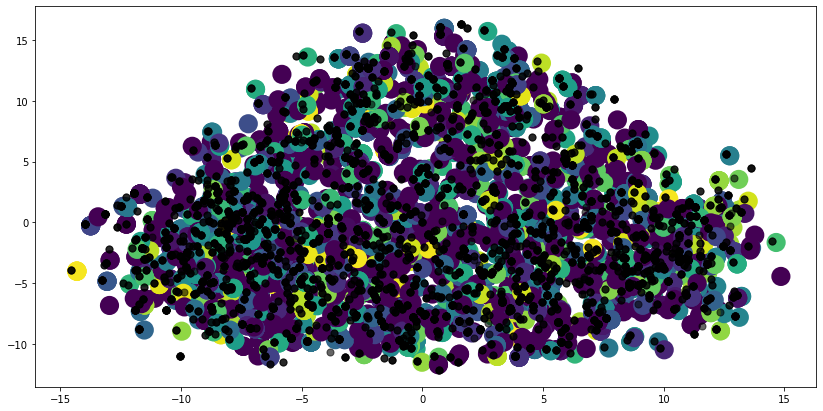

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2_test.iloc[:, 0], principalComponents_all_mpnet_basev2_test.iloc[:, 1], c=labels , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
with open('dbscan_17_2_all_mpnet_basev2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mpnet_basev2, f)

In [ ]:
DBSCAN_cluster_all_mpnet_basev2_2 = DBSCAN(eps=20, min_samples=2).fit(principalComponents_all_mpnet_basev2) 
labels_2 = dbscan_predict(DBSCAN_cluster_all_mpnet_basev2_2, principalComponents_all_mpnet_basev2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2,DBSCAN_cluster_all_mpnet_basev2_2.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2, DBSCAN_cluster_all_mpnet_basev2_2.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  32.93747334312442
silhouette score of model on train data:  0.7705809411537777


In [ ]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mpnet_basev2_2.labels_)))

Number of cluster:  1263


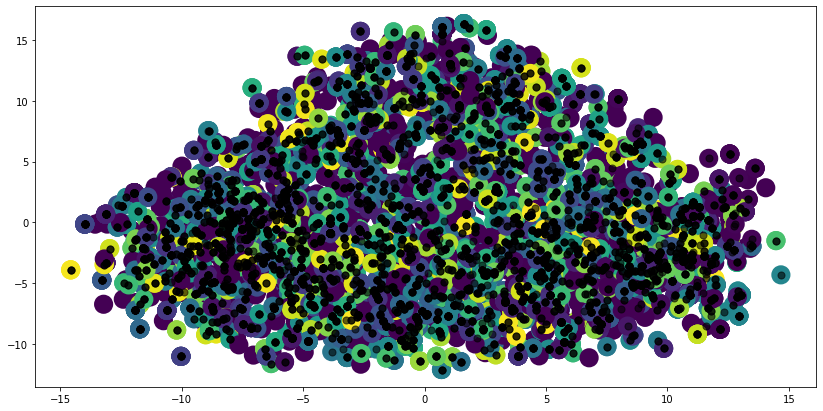

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2.iloc[:, 0], principalComponents_all_mpnet_basev2.iloc[:, 1], c=DBSCAN_cluster_all_mpnet_basev2_2.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2_2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2_test,labels_2 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2_test, labels_2, metric='euclidean'))

calinski harabasz score of model on test data:  8.287528956724076
silhouette score of model on test data:  0.5297255705848571


In [ ]:
print("Number of cluster: ",len(np.unique(labels_2)))

Number of cluster:  896


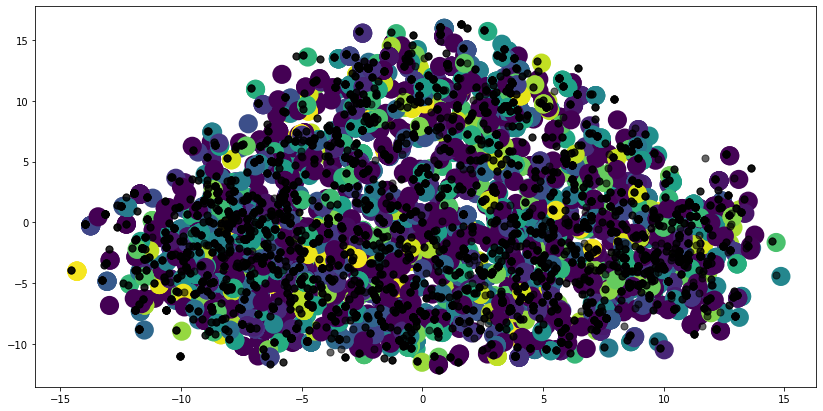

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2_test.iloc[:, 0], principalComponents_all_mpnet_basev2_test.iloc[:, 1], c=labels_2 , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2_2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
with open('dbscan_20_2_all_mpnet_basev2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mpnet_basev2_2, f)

In [ ]:
DBSCAN_cluster_all_mpnet_basev2_3 = DBSCAN(eps=15, min_samples=2).fit(principalComponents_all_mpnet_basev2) 
labels_3 = dbscan_predict(DBSCAN_cluster_all_mpnet_basev2_3, principalComponents_all_mpnet_basev2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2,DBSCAN_cluster_all_mpnet_basev2_3.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2, DBSCAN_cluster_all_mpnet_basev2_3.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  31.434036258674944
silhouette score of model on train data:  0.822235287690896


In [ ]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mpnet_basev2_3.labels_)))

Number of cluster:  1361


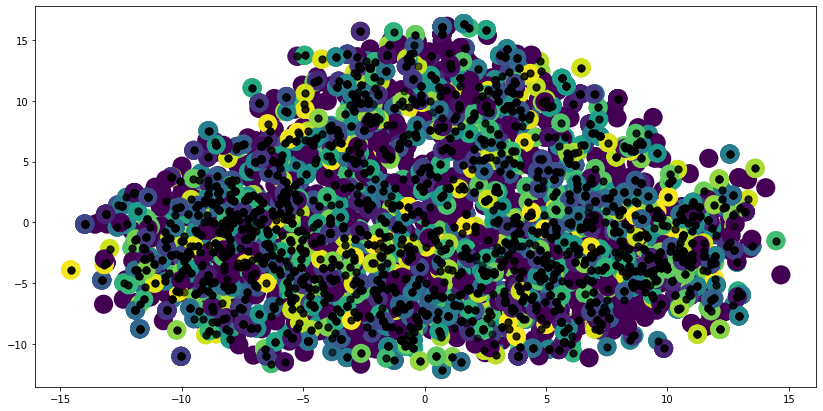

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2.iloc[:, 0], principalComponents_all_mpnet_basev2.iloc[:, 1], c=DBSCAN_cluster_all_mpnet_basev2_3.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2_3.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2_test,labels_3 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2_test, labels_3, metric='euclidean'))

calinski harabasz score of model on test data:  7.294105657337678
silhouette score of model on test data:  0.5397418685260074


In [ ]:
print("Number of cluster: ",len(np.unique(labels_3)))

Number of cluster:  936


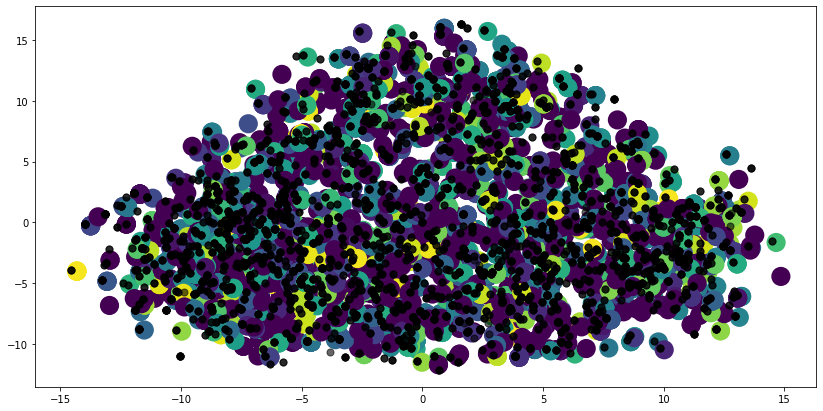

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2_test.iloc[:, 0], principalComponents_all_mpnet_basev2_test.iloc[:, 1], c=labels_3 , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2_3.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
with open('dbscan_15_2_all_mpnet_basev2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mpnet_basev2_3, f)

In [ ]:
DBSCAN_cluster_all_mpnet_basev2_4 = DBSCAN(eps=25, min_samples=2).fit(principalComponents_all_mpnet_basev2) 
labels_4 = dbscan_predict(DBSCAN_cluster_all_mpnet_basev2_4, principalComponents_all_mpnet_basev2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2,DBSCAN_cluster_all_mpnet_basev2_4.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2, DBSCAN_cluster_all_mpnet_basev2_4.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  8.778996726182296
silhouette score of model on train data:  0.17291439504194375


In [ ]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mpnet_basev2_4.labels_)))

Number of cluster:  511


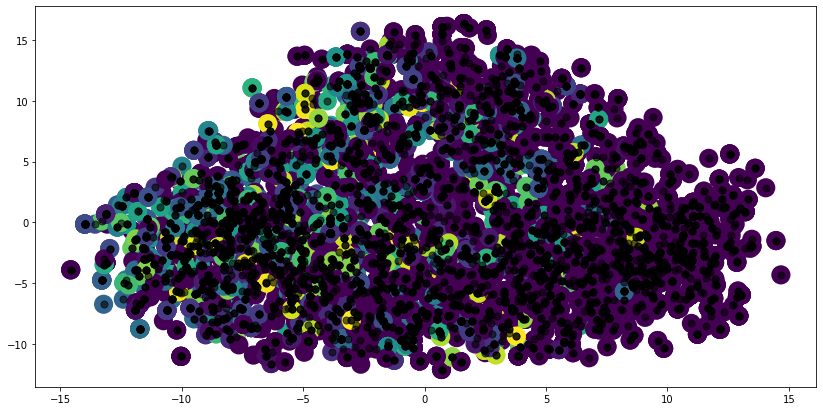

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2.iloc[:, 0], principalComponents_all_mpnet_basev2.iloc[:, 1], c=DBSCAN_cluster_all_mpnet_basev2_4.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2_4.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2_test,labels_4 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2_test, labels_4, metric='euclidean'))

calinski harabasz score of model on test data:  4.2729246038455555
silhouette score of model on test data:  0.10509704411849626


In [ ]:
print("Number of cluster: ",len(np.unique(labels_4)))

Number of cluster:  382


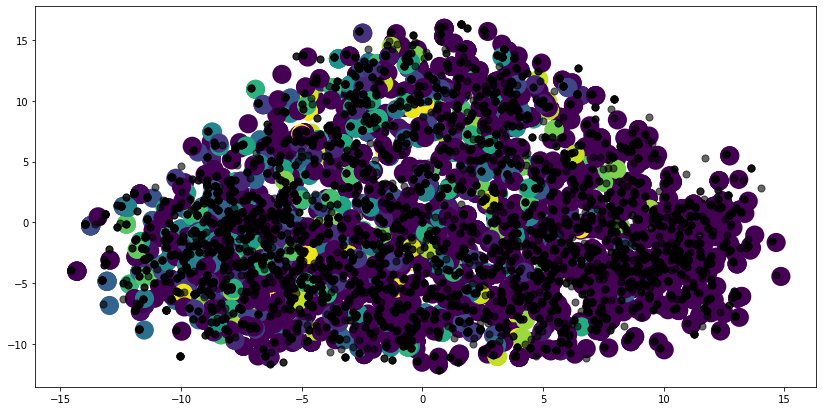

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2_test.iloc[:, 0], principalComponents_all_mpnet_basev2_test.iloc[:, 1], c=labels_4 , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2_4.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
with open('dbscan_25_2_all_mpnet_basev2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mpnet_basev2_4, f)

In [ ]:
for i in range(2,10):
  DBSCAN_cluster_all_mpnet_basev2_min_samp = DBSCAN(eps=15, min_samples=i).fit(principalComponents_all_mpnet_basev2) 
  print("calinski harabasz score of model with min_samples as {min}: {ch} ".format(min=i, ch= metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2,DBSCAN_cluster_all_mpnet_basev2_min_samp.labels_ )) )
  print("silhouette score of model with min_samples as {min}: {ss}".format(min = i, ss= metrics.silhouette_score(principalComponents_all_mpnet_basev2, DBSCAN_cluster_all_mpnet_basev2_min_samp.labels_ , metric='euclidean')) )


calinski harabasz score of model with min_samples as 2: 31.434036258674944 
silhouette score of model with min_samples as 2: 0.822235287690896
calinski harabasz score of model with min_samples as 3: 21.66529337725076 
silhouette score of model with min_samples as 3: 0.6548414431900877
calinski harabasz score of model with min_samples as 4: 18.94466461610919 
silhouette score of model with min_samples as 4: 0.5000902194852783
calinski harabasz score of model with min_samples as 5: 18.17476285516788 
silhouette score of model with min_samples as 5: 0.3974627883597231
calinski harabasz score of model with min_samples as 6: 17.90657064196585 
silhouette score of model with min_samples as 6: 0.30180674747740227
calinski harabasz score of model with min_samples as 7: 18.057541058296028 
silhouette score of model with min_samples as 7: 0.2315753026404692
calinski harabasz score of model with min_samples as 8: 18.24292763551641 
silhouette score of model with min_samples as 8: 0.16285040236426

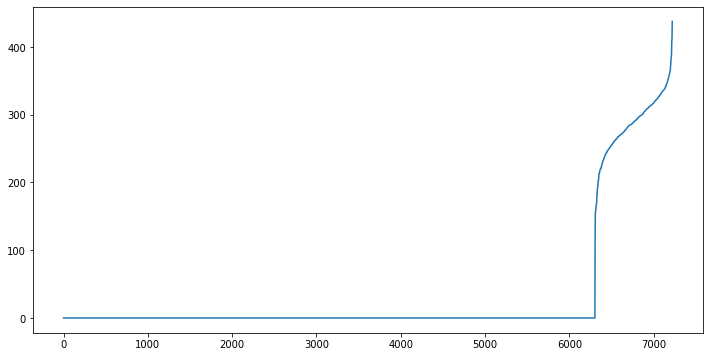

In [ ]:
#https://stats.stackexchange.com/questions/406587/determining-epsilon-for-dbscan
#https://towardsdatascience.com/machine-learning-clustering-dbscan-determine-the-optimal-value-for-epsilon-eps-python-example-3100091cfbc

neigh = NearestNeighbors(n_neighbors=2, metric='manhattan')
nbrs = neigh.fit(principalComponents_all_mpnet_basev2)
distances, indices = nbrs.kneighbors(principalComponents_all_mpnet_basev2)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [ ]:
DBSCAN_cluster_all_mpnet_basev2_manhattan= DBSCAN(eps=250, min_samples=2, metric="manhattan").fit(principalComponents_all_mpnet_basev2) 
labels_manhattan = dbscan_predict_manhattan(DBSCAN_cluster_all_mpnet_basev2_manhattan, principalComponents_all_mpnet_basev2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2,DBSCAN_cluster_all_mpnet_basev2_manhattan.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2, DBSCAN_cluster_all_mpnet_basev2_manhattan.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  32.06942281754388
silhouette score of model on train data:  0.7702152036848136


In [ ]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mpnet_basev2_manhattan.labels_)))

Number of cluster:  1268


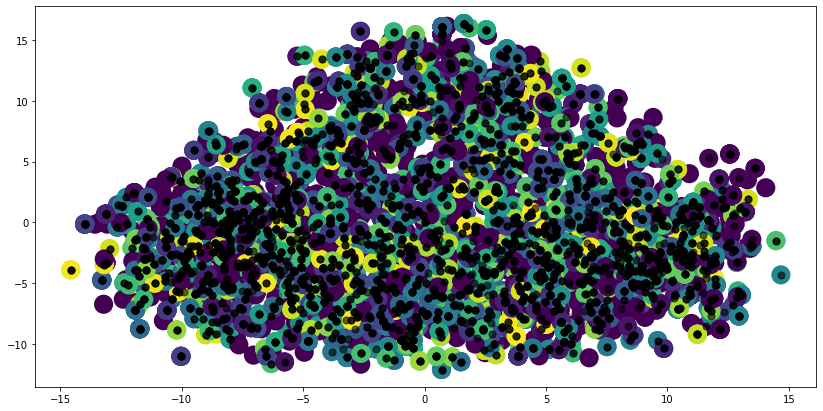

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2.iloc[:, 0], principalComponents_all_mpnet_basev2.iloc[:, 1], c=DBSCAN_cluster_all_mpnet_basev2_manhattan.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2_manhattan.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2_test,labels_manhattan ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2_test, labels_manhattan, metric='euclidean'))

calinski harabasz score of model on test data:  1.0615172290505057
silhouette score of model on test data:  0.012836018740934492


In [ ]:
print("Number of cluster: ",len(np.unique(labels_manhattan)))

Number of cluster:  2


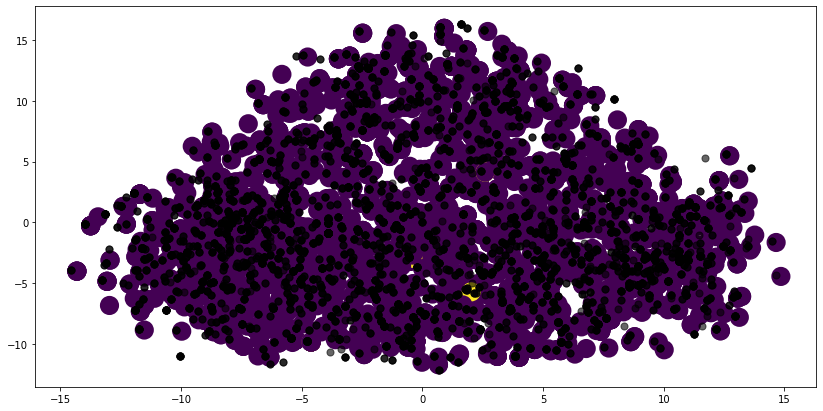

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2_test.iloc[:, 0], principalComponents_all_mpnet_basev2_test.iloc[:, 1], c=labels_manhattan , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2_manhattan.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
with open('dbscan_manhattan_250_2_all_mpnet_basev2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mpnet_basev2_manhattan, f)

In [ ]:
DBSCAN_cluster_all_mpnet_basev2_manhattan_2= DBSCAN(eps=300, min_samples=2, metric="manhattan").fit(principalComponents_all_mpnet_basev2) 
labels_manhattan_2 = dbscan_predict_manhattan(DBSCAN_cluster_all_mpnet_basev2_manhattan_2, principalComponents_all_mpnet_basev2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2,DBSCAN_cluster_all_mpnet_basev2_manhattan_2.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2, DBSCAN_cluster_all_mpnet_basev2_manhattan_2.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  11.24870622752825
silhouette score of model on train data:  0.3211995895554129


In [ ]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mpnet_basev2_manhattan_2.labels_)))

Number of cluster:  704


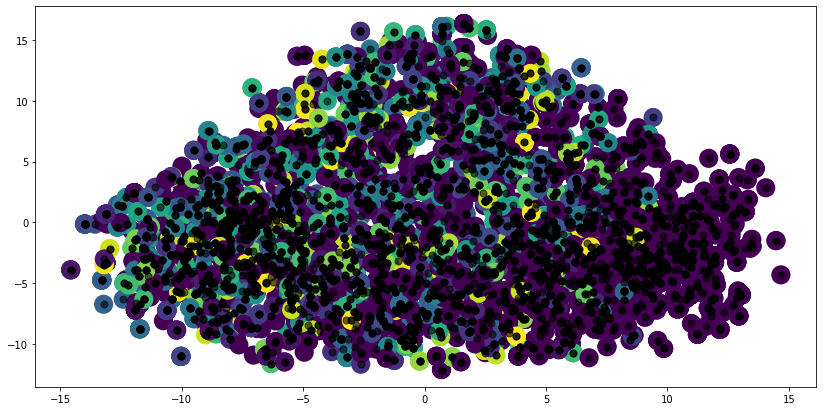

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2.iloc[:, 0], principalComponents_all_mpnet_basev2.iloc[:, 1], c=DBSCAN_cluster_all_mpnet_basev2_manhattan_2.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2_manhattan_2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2_test,labels_manhattan_2 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2_test, labels_manhattan_2, metric='euclidean'))

calinski harabasz score of model on test data:  0.9716386392393516
silhouette score of model on test data:  -0.0034903647247413964


In [ ]:
print("Number of cluster: ",len(np.unique(labels_manhattan_2)))

Number of cluster:  2


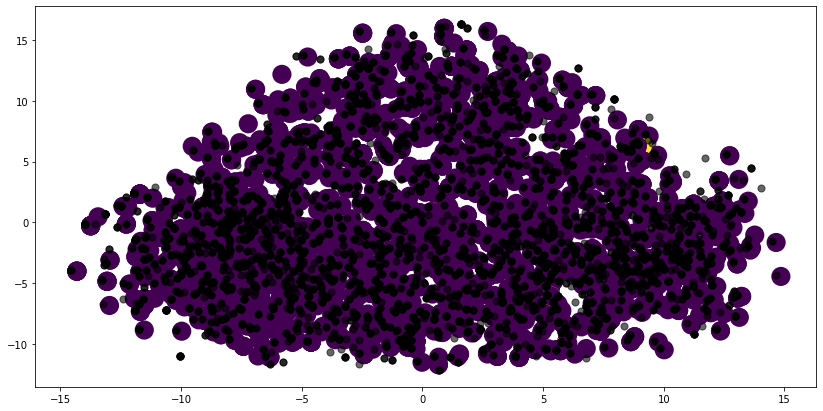

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2_test.iloc[:, 0], principalComponents_all_mpnet_basev2_test.iloc[:, 1], c=labels_manhattan_2, s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2_manhattan_2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
with open('dbscan_manhattan_300_2_all_mpnet_basev2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mpnet_basev2_manhattan_2, f)

In [ ]:
DBSCAN_cluster_all_mpnet_basev2_manhattan_3= DBSCAN(eps=280, min_samples=2, metric="manhattan").fit(principalComponents_all_mpnet_basev2) 
labels_manhattan_3 = dbscan_predict_manhattan(DBSCAN_cluster_all_mpnet_basev2_manhattan_3, principalComponents_all_mpnet_basev2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2,DBSCAN_cluster_all_mpnet_basev2_manhattan_3.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2, DBSCAN_cluster_all_mpnet_basev2_manhattan_3.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  20.54958380210849
silhouette score of model on train data:  0.5880089493640801


In [ ]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mpnet_basev2_manhattan_3.labels_)))

Number of cluster:  1004


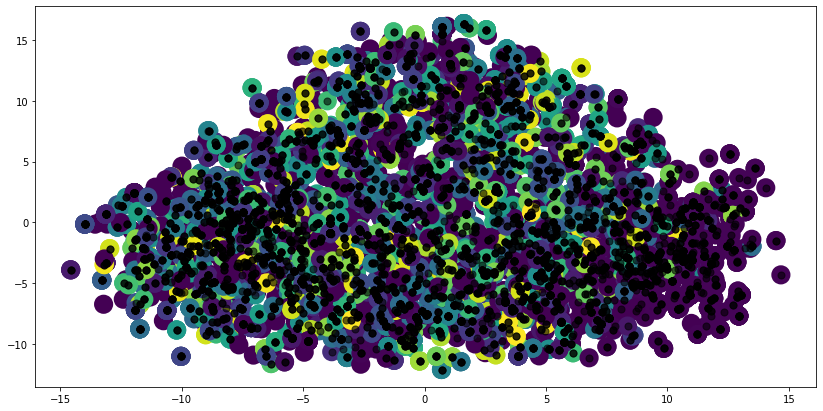

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2.iloc[:, 0], principalComponents_all_mpnet_basev2.iloc[:, 1], c=DBSCAN_cluster_all_mpnet_basev2_manhattan_3.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2_manhattan_3.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2_test,labels_manhattan_3 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2_test, labels_manhattan_3, metric='euclidean'))

calinski harabasz score of model on test data:  1.1732337588619117
silhouette score of model on test data:  0.007176481375307738


In [ ]:
print("Number of cluster: ",len(np.unique(labels_manhattan_3)))

Number of cluster:  2


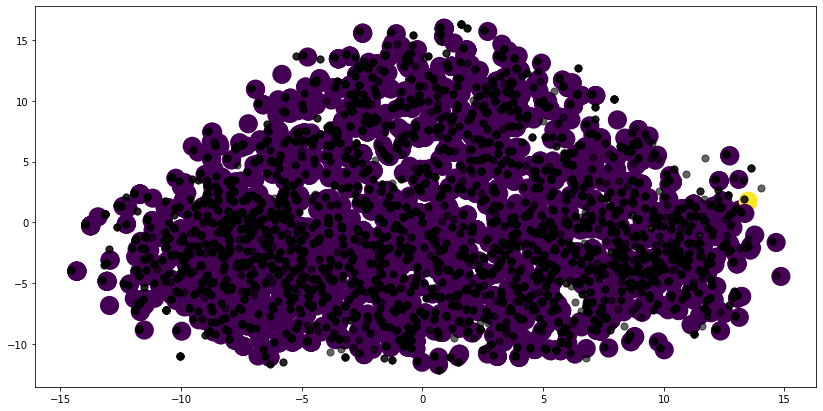

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2_test.iloc[:, 0], principalComponents_all_mpnet_basev2_test.iloc[:, 1], c=labels_manhattan_3 , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2_manhattan_3.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
with open('dbscan_manhattan_280_2_all_mpnet_basev2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mpnet_basev2_manhattan_3, f)

In [ ]:
for i in range(2,10):
  DBSCAN_cluster_all_mpnet_basev2_min_samp_manhattan = DBSCAN(eps=250, min_samples=i, metric="manhattan").fit(principalComponents_all_mpnet_basev2) 
  print("calinski harabasz score of model with min_samples as {min}: {ch} ".format(min=i, ch= metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2,DBSCAN_cluster_all_mpnet_basev2_min_samp_manhattan.labels_ )) )
  print("silhouette score of model with min_samples as {min}: {ss}".format(min = i, ss= metrics.silhouette_score(principalComponents_all_mpnet_basev2, DBSCAN_cluster_all_mpnet_basev2_min_samp_manhattan.labels_ , metric='euclidean')) )


calinski harabasz score of model with min_samples as 2: 32.06942281754388 
silhouette score of model with min_samples as 2: 0.7702152036848136
calinski harabasz score of model with min_samples as 3: 23.76724418364511 
silhouette score of model with min_samples as 3: 0.6335374886224723
calinski harabasz score of model with min_samples as 4: 20.762066997594793 
silhouette score of model with min_samples as 4: 0.4980414234701438
calinski harabasz score of model with min_samples as 5: 19.805979594051582 
silhouette score of model with min_samples as 5: 0.40223911599317397
calinski harabasz score of model with min_samples as 6: 19.4632006342646 
silhouette score of model with min_samples as 6: 0.31668864728409135
calinski harabasz score of model with min_samples as 7: 19.45380867394277 
silhouette score of model with min_samples as 7: 0.25164999718728664
calinski harabasz score of model with min_samples as 8: 19.58858158755652 
silhouette score of model with min_samples as 8: 0.183631008912

### Model : paraphrase-MiniLM-L3-v2

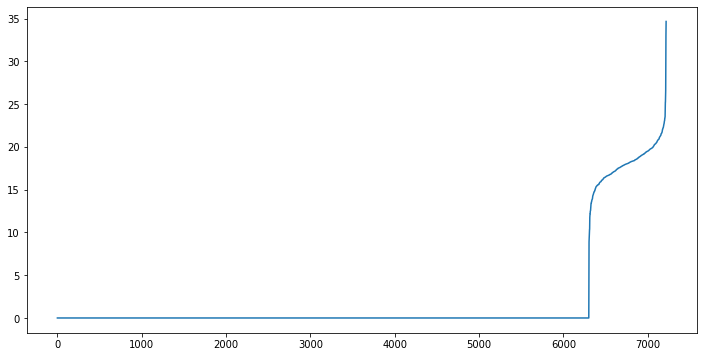

In [ ]:
#https://stats.stackexchange.com/questions/406587/determining-epsilon-for-dbscan
#https://towardsdatascience.com/machine-learning-clustering-dbscan-determine-the-optimal-value-for-epsilon-eps-python-example-3100091cfbc

neigh = NearestNeighbors(n_neighbors=2, metric='euclidean')
nbrs = neigh.fit(principalComponents_all_minilm_l3v2)
distances, indices = nbrs.kneighbors(principalComponents_all_minilm_l3v2)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [ ]:
DBSCAN_cluster_all_minilm_l3v2 = DBSCAN(eps=17, min_samples=2).fit(principalComponents_all_minilm_l3v2) 
labels = dbscan_predict(DBSCAN_cluster_all_minilm_l3v2, principalComponents_all_minilm_l3v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2,DBSCAN_cluster_all_minilm_l3v2.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2, DBSCAN_cluster_all_minilm_l3v2.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  19.01017176116134
silhouette score of model on train data:  0.6286734766061222


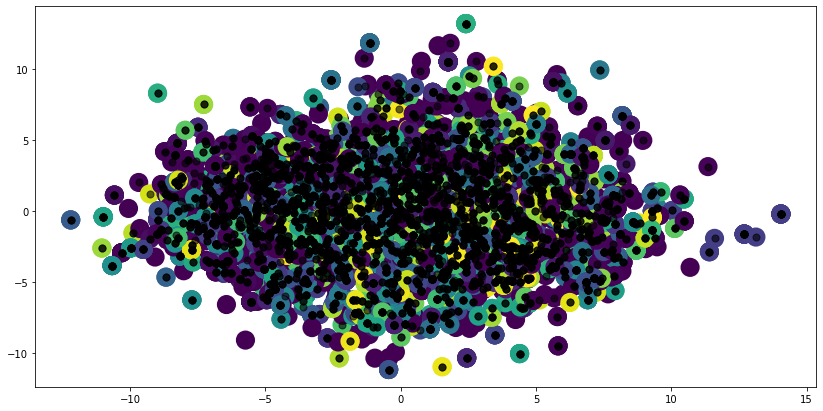

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2.iloc[:, 0], principalComponents_all_minilm_l3v2.iloc[:, 1], c=DBSCAN_cluster_all_minilm_l3v2.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_minilm_l3v2.labels_)))

Number of cluster:  1057


In [ ]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2_test,labels ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2_test, labels, metric='euclidean'))

calinski harabasz score of model on test data:  6.252203386643704
silhouette score of model on test data:  0.42366651934530114


In [ ]:
print("Number of cluster: ",len(np.unique(labels)))

Number of cluster:  773


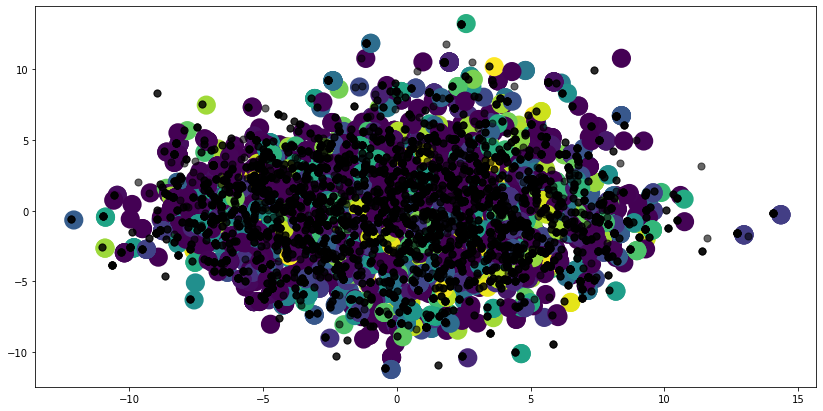

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2_test.iloc[:, 0], principalComponents_all_minilm_l3v2_test.iloc[:, 1], c=labels , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
with open('dbscan_17_2_all_minilm_l3v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_minilm_l3v2, f)

In [ ]:
DBSCAN_cluster_all_minilm_l3v2_2 = DBSCAN(eps=20, min_samples=2).fit(principalComponents_all_minilm_l3v2) 
labels_2 = dbscan_predict(DBSCAN_cluster_all_minilm_l3v2_2, principalComponents_all_minilm_l3v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2,DBSCAN_cluster_all_minilm_l3v2_2.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2, DBSCAN_cluster_all_minilm_l3v2_2.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  8.120410824849921
silhouette score of model on train data:  0.051195318014066245


In [ ]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_minilm_l3v2_2.labels_)))

Number of cluster:  256


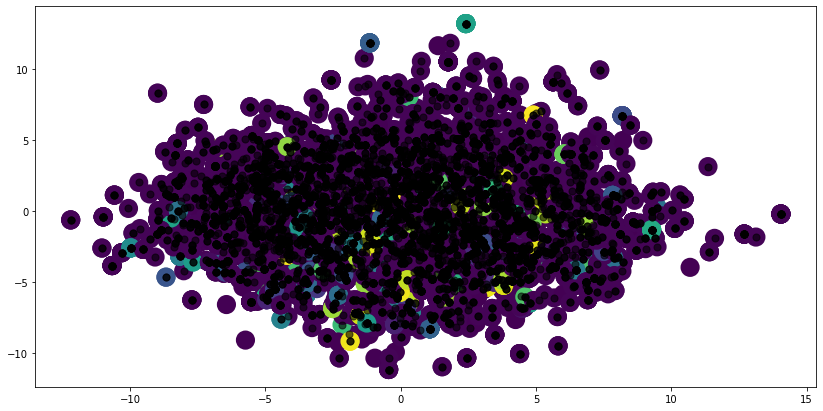

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2.iloc[:, 0], principalComponents_all_minilm_l3v2.iloc[:, 1], c=DBSCAN_cluster_all_minilm_l3v2_2.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2_2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2_test,labels_2 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2_test, labels_2, metric='euclidean'))

calinski harabasz score of model on test data:  3.986060241530933
silhouette score of model on test data:  0.010175741591819458


In [ ]:
print("Number of cluster: ",len(np.unique(labels_2)))

Number of cluster:  178


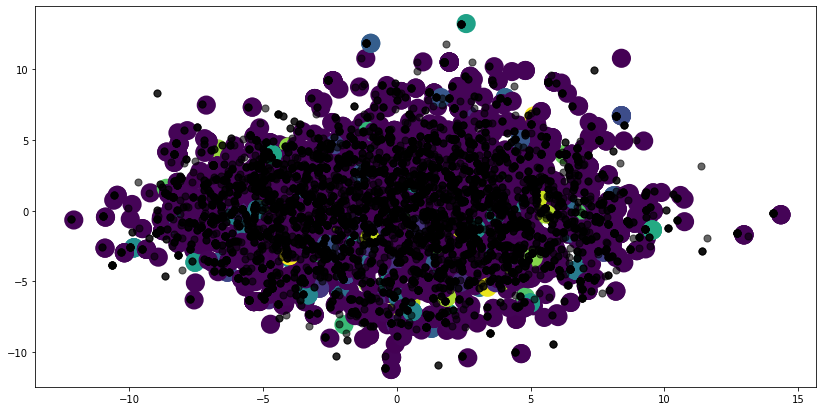

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2_test.iloc[:, 0], principalComponents_all_minilm_l3v2_test.iloc[:, 1], c=labels_2 , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2_2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
with open('dbscan_20_2_all_minilm_l3v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_minilm_l3v2_2, f)

In [ ]:
DBSCAN_cluster_all_minilm_l3v2_3 = DBSCAN(eps=15, min_samples=2).fit(principalComponents_all_minilm_l3v2) 
labels_3 = dbscan_predict(DBSCAN_cluster_all_minilm_l3v2_3, principalComponents_all_minilm_l3v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2,DBSCAN_cluster_all_minilm_l3v2_3.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2, DBSCAN_cluster_all_minilm_l3v2_3.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  30.913409951970415
silhouette score of model on train data:  0.8054326538782033


In [ ]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_minilm_l3v2_3.labels_)))

Number of cluster:  1317


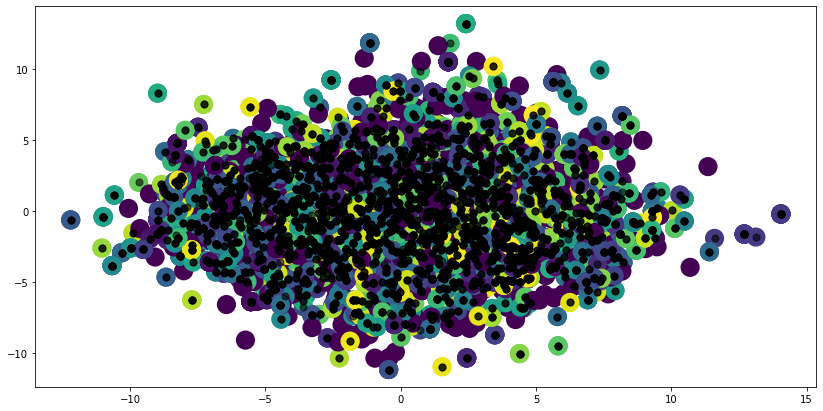

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2.iloc[:, 0], principalComponents_all_minilm_l3v2.iloc[:, 1], c=DBSCAN_cluster_all_minilm_l3v2_3.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2_3.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2_test,labels_3 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2_test, labels_3, metric='euclidean'))

calinski harabasz score of model on test data:  7.383339377391727
silhouette score of model on test data:  0.5417102663213813


In [ ]:
print("Number of cluster: ",len(np.unique(labels_3)))

Number of cluster:  914


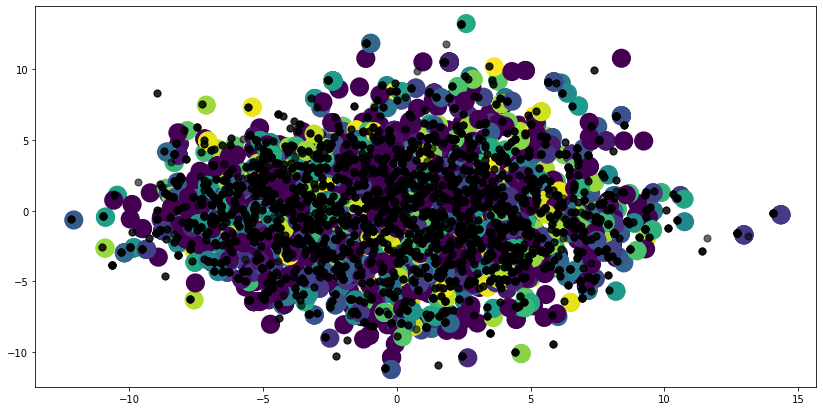

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2_test.iloc[:, 0], principalComponents_all_minilm_l3v2_test.iloc[:, 1], c=labels_3 , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2_3.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
with open('dbscan_15_2_all_minilm_l3v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_minilm_l3v2_3, f)

In [ ]:
DBSCAN_cluster_all_minilm_l3v2_4 = DBSCAN(eps=25, min_samples=2).fit(principalComponents_all_minilm_l3v2) 
labels_4 = dbscan_predict(DBSCAN_cluster_all_minilm_l3v2_4, principalComponents_all_minilm_l3v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2,DBSCAN_cluster_all_mini_l6v2_4.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2, DBSCAN_cluster_all_mini_l6v2_4.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  11.914582409292203
silhouette score of model on train data:  0.031720648301425444


In [ ]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_minilm_l3v2_4.labels_)))

Number of cluster:  16


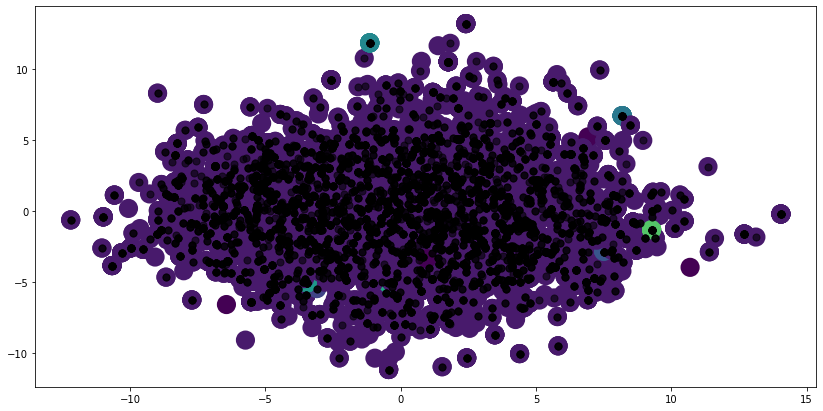

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2.iloc[:, 0], principalComponents_all_minilm_l3v2.iloc[:, 1], c=DBSCAN_cluster_all_minilm_l3v2_4.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2_test,labels_4 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2_test, labels_4, metric='euclidean'))

calinski harabasz score of model on test data:  9.898273164962973
silhouette score of model on test data:  0.12685002334805542


In [ ]:
print("Number of cluster: ",len(np.unique(labels_4)))

Number of cluster:  11


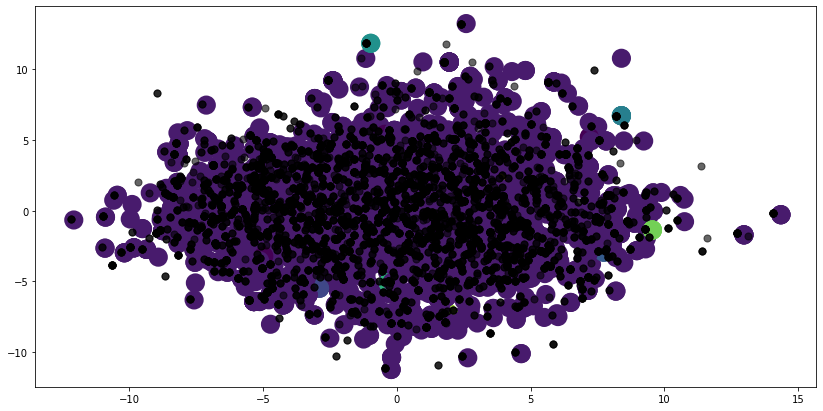

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2_test.iloc[:, 0], principalComponents_all_minilm_l3v2_test.iloc[:, 1], c=labels_4 , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
with open('dbscan_25_2_all_minilm_l3v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_minilm_l3v2_4, f)

In [ ]:
for i in range(2,10):
  DBSCAN_cluster_all_minilm_l3v2_min_samp = DBSCAN(eps=15, min_samples=i).fit(principalComponents_all_minilm_l3v2) 
  print("calinski harabasz score of model with min_samples as {min}: {ch} ".format(min=i, ch= metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2,DBSCAN_cluster_all_minilm_l3v2_min_samp.labels_ )) )
  print("silhouette score of model with min_samples as {min}: {ss}".format(min = i, ss= metrics.silhouette_score(principalComponents_all_minilm_l3v2, DBSCAN_cluster_all_minilm_l3v2_min_samp.labels_ , metric='euclidean')) )


calinski harabasz score of model with min_samples as 2: 30.913409951970415 
silhouette score of model with min_samples as 2: 0.8054326538782033
calinski harabasz score of model with min_samples as 3: 22.12853425625527 
silhouette score of model with min_samples as 3: 0.6566279945120074
calinski harabasz score of model with min_samples as 4: 19.83097393070055 
silhouette score of model with min_samples as 4: 0.5159362905397264
calinski harabasz score of model with min_samples as 5: 18.67646854100415 
silhouette score of model with min_samples as 5: 0.42084801417679174
calinski harabasz score of model with min_samples as 6: 18.574616881355055 
silhouette score of model with min_samples as 6: 0.32892964146080406
calinski harabasz score of model with min_samples as 7: 18.7661427557441 
silhouette score of model with min_samples as 7: 0.26324917032268863
calinski harabasz score of model with min_samples as 8: 19.138679553962284 
silhouette score of model with min_samples as 8: 0.19010036646

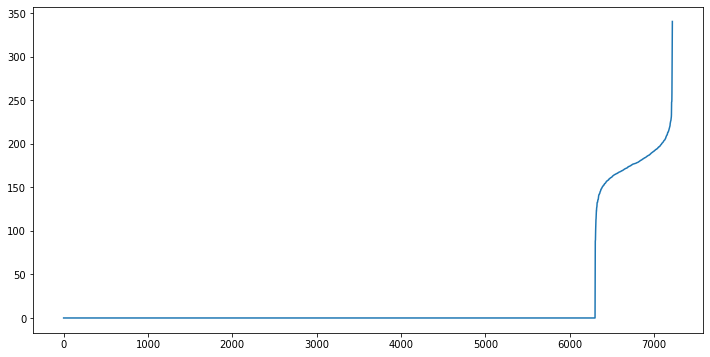

In [ ]:
#https://stats.stackexchange.com/questions/406587/determining-epsilon-for-dbscan
#https://towardsdatascience.com/machine-learning-clustering-dbscan-determine-the-optimal-value-for-epsilon-eps-python-example-3100091cfbc

neigh = NearestNeighbors(n_neighbors=2, metric='manhattan')
nbrs = neigh.fit(principalComponents_all_minilm_l3v2)
distances, indices = nbrs.kneighbors(principalComponents_all_minilm_l3v2)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [ ]:
DBSCAN_cluster_all_minilm_l3v2_manhattan= DBSCAN(eps=180, min_samples=2, metric="manhattan").fit(principalComponents_all_minilm_l3v2) 
labels_manhattan = dbscan_predict_manhattan(DBSCAN_cluster_all_minilm_l3v2_manhattan, principalComponents_all_minilm_l3v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2,DBSCAN_cluster_all_minilm_l3v2_manhattan.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2, DBSCAN_cluster_all_minilm_l3v2_manhattan.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  9.336717897987757
silhouette score of model on train data:  0.27171787445880424


In [ ]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_minilm_l3v2_manhattan.labels_)))

Number of cluster:  632


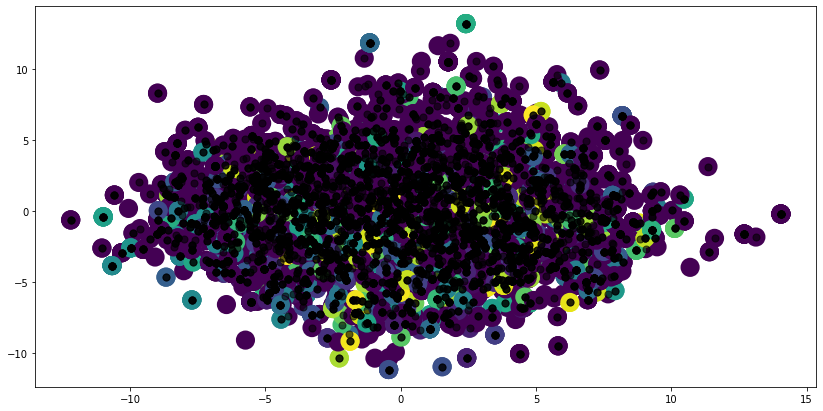

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2.iloc[:, 0], principalComponents_all_minilm_l3v2.iloc[:, 1], c=DBSCAN_cluster_all_minilm_l3v2_manhattan.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2_manhattan.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2_test,labels_manhattan ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2_test, labels_manhattan, metric='euclidean'))

calinski harabasz score of model on test data:  0.9945506183773067
silhouette score of model on test data:  -0.02699388358560119


In [ ]:
print("Number of cluster: ",len(np.unique(labels_manhattan)))

Number of cluster:  2


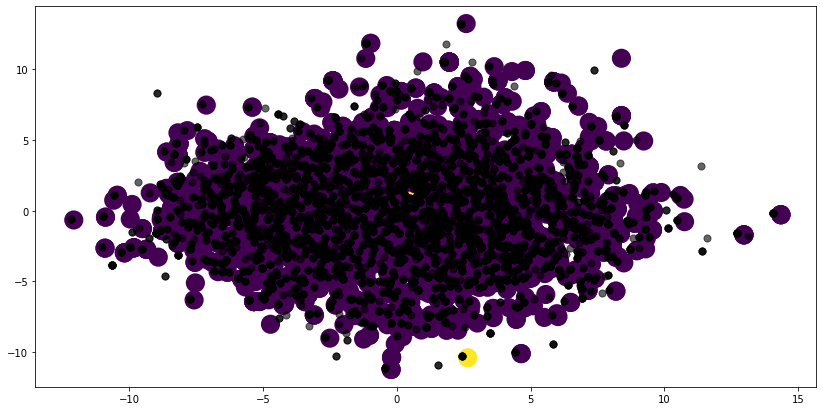

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2_test.iloc[:, 0], principalComponents_all_minilm_l3v2_test.iloc[:, 1], c=labels_manhattan , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2_manhattan.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
with open('dbscan_manhattan_180_2_all_minilm_l3v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_minilm_l3v2_manhattan, f)

In [ ]:
DBSCAN_cluster_all_minilm_l3v2_manhattan_2= DBSCAN(eps=150, min_samples=2, metric="manhattan").fit(principalComponents_all_minilm_l3v2) 
labels_manhattan_2 = dbscan_predict_manhattan(DBSCAN_cluster_all_minilm_l3v2_manhattan_2, principalComponents_all_minilm_l3v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2,DBSCAN_cluster_all_minilm_l3v2_manhattan_2.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2, DBSCAN_cluster_all_minilm_l3v2_manhattan_2.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  30.087625515650537
silhouette score of model on train data:  0.7955308357915064


In [ ]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_minilm_l3v2_manhattan_2.labels_)))

Number of cluster:  1304


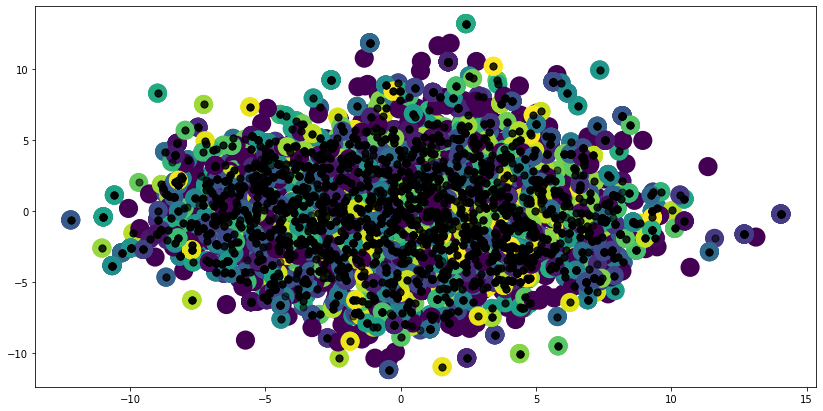

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2.iloc[:, 0], principalComponents_all_minilm_l3v2.iloc[:, 1], c=DBSCAN_cluster_all_minilm_l3v2_manhattan_2.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2_manhattan_2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2_test,labels_manhattan_2 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2_test, labels_manhattan_2, metric='euclidean'))

calinski harabasz score of model on test data:  0.8871010339721496
silhouette score of model on test data:  -0.019425809507720108


In [ ]:
print("Number of cluster: ",len(np.unique(labels_manhattan_2)))

Number of cluster:  2


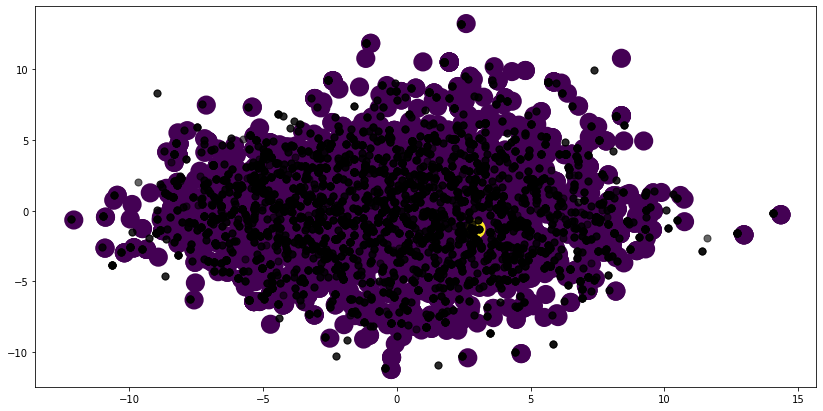

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2_test.iloc[:, 0], principalComponents_all_minilm_l3v2_test.iloc[:, 1], c=labels_manhattan_2, s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2_manhattan_2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
with open('dbscan_manhattan_150_2_all_minilm_l3v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_minilm_l3v2_manhattan_2, f)

In [ ]:
DBSCAN_cluster_all_minilm_l3v2_manhattan_3= DBSCAN(eps=200, min_samples=2, metric="manhattan").fit(principalComponents_all_minilm_l3v2) 
labels_manhattan_3 = dbscan_predict_manhattan(DBSCAN_cluster_all_minilm_l3v2_manhattan_3, principalComponents_all_minilm_l3v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2,DBSCAN_cluster_all_minilm_l3v2_manhattan_3.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2, DBSCAN_cluster_all_minilm_l3v2_manhattan_3.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  7.7412390370781266
silhouette score of model on train data:  0.01968652641169103


In [ ]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_minilm_l3v2_manhattan_3.labels_)))

Number of cluster:  195


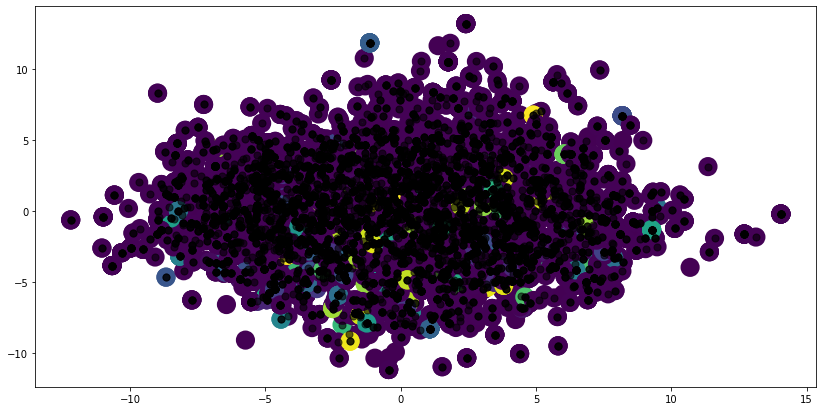

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2.iloc[:, 0], principalComponents_all_minilm_l3v2.iloc[:, 1], c=DBSCAN_cluster_all_minilm_l3v2_manhattan_3.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2_manhattan_3.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2_test,labels_manhattan_3 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2_test, labels_manhattan_3, metric='euclidean'))

calinski harabasz score of model on test data:  1.1660336141881809
silhouette score of model on test data:  -0.051063348753123905


In [ ]:
print("Number of cluster: ",len(np.unique(labels_manhattan_3)))

Number of cluster:  2


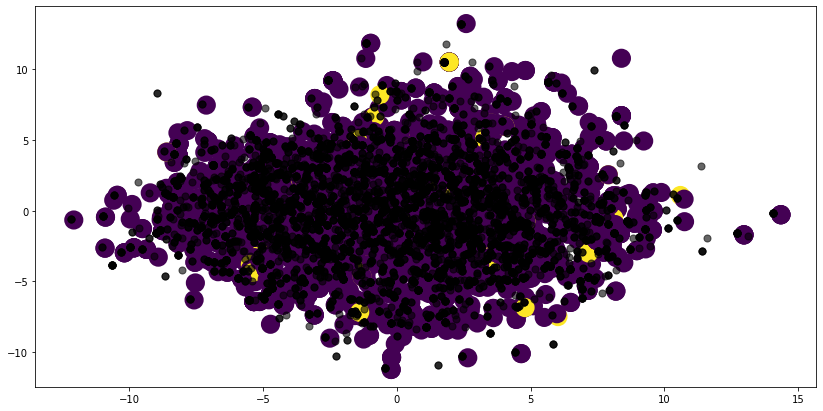

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2_test.iloc[:, 0], principalComponents_all_minilm_l3v2_test.iloc[:, 1], c=labels_manhattan_3 , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2_manhattan_3.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [ ]:
with open('dbscan_manhattan_200_2_all_minilm_l3v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_minilm_l3v2_manhattan_3, f)

In [ ]:
for i in range(2,10):
  DBSCAN_cluster_all_minilm_l3v2_min_samp_manhattan = DBSCAN(eps=150, min_samples=i, metric="manhattan").fit(principalComponents_all_minilm_l3v2) 
  print("calinski harabasz score of model with min_samples as {min}: {ch} ".format(min=i, ch= metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2,DBSCAN_cluster_all_minilm_l3v2_min_samp_manhattan.labels_ )) )
  print("silhouette score of model with min_samples as {min}: {ss}".format(min = i, ss= metrics.silhouette_score(principalComponents_all_minilm_l3v2, DBSCAN_cluster_all_minilm_l3v2_min_samp_manhattan.labels_ , metric='euclidean')) )


calinski harabasz score of model with min_samples as 2: 30.087625515650537 
silhouette score of model with min_samples as 2: 0.7955308357915064
calinski harabasz score of model with min_samples as 3: 21.97736725095626 
silhouette score of model with min_samples as 3: 0.649044894490838
calinski harabasz score of model with min_samples as 4: 19.866548137343052 
silhouette score of model with min_samples as 4: 0.5094828639845338
calinski harabasz score of model with min_samples as 5: 18.805793169152185 
silhouette score of model with min_samples as 5: 0.41423693485492874
calinski harabasz score of model with min_samples as 6: 18.733558810745325 
silhouette score of model with min_samples as 6: 0.3243411061998235
calinski harabasz score of model with min_samples as 7: 18.975608147484053 
silhouette score of model with min_samples as 7: 0.2592241612387687
calinski harabasz score of model with min_samples as 8: 19.464336822478106 
silhouette score of model with min_samples as 8: 0.1883168344

## Gaussian Mixture

### Model : all-MiniLM-L6-v2

In [1]:
int(principalComponents_all_mini_l6v2.shape[0]/5)

NameError: name 'principalComponents_all_mini_l6v2' is not defined

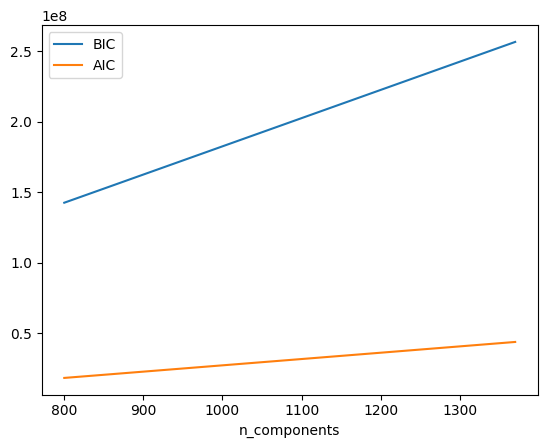

In [9]:
n_components = np.arange(800, 1400, 30)
models = [GaussianMixture(n, covariance_type='full', random_state=0).fit(principalComponents_all_mini_l6v2)
          for n in n_components]

plt.plot(n_components, [m.bic(principalComponents_all_mini_l6v2) for m in models], label='BIC')
plt.plot(n_components, [m.aic(principalComponents_all_mini_l6v2) for m in models], label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components');

In [ ]:
gmm_all_mini_l6v2 = GaussianMixture(n_components=4, covariance_type='full', random_state=0).fit(principalComponents_all_mini_l6v2)
labels = gmm_all_mini_l6v2.predict(principalComponents_all_mini_l6v2_test)
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2,gmm_all_mini_l6v2.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2, gmm_all_mini_l6v2.labels_ , metric='euclidean'))


In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2.iloc[:, 0], principalComponents_all_mini_l6v2.iloc[:, 1], c=gmm_all_mini_l6v2.labels_ , s=200, cmap='viridis', linewidths=5)


In [ ]:
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2_test,labels ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2_test, labels , metric='euclidean'))


In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2_test.iloc[:, 0], principalComponents_all_mini_l6v2_test.iloc[:, 1], c=labels , s=200, cmap='viridis', linewidths=5)


In [ ]:
with open('gm_.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mpnet_basev2_manhattan_3, f)

In [ ]:
#run this on local bc of limitations of colab
n_components = np.arange(800, 1400, 30)
models = [GaussianMixture(n, covariance_type='full', random_state=0).fit(principalComponents_all_mpnet_basev2)
          for n in n_components]

plt.plot(n_components, [m.bic(principalComponents_all_mpnet_basev2) for m in models], label='BIC')
plt.plot(n_components, [m.aic(principalComponents_all_mpnet_basev2) for m in models], label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components');